In [1]:
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
import numpy as np
import seaborn as sns; sns.set()
import scipy.stats as st
import sys
np.set_printoptions(threshold=sys.maxsize)

In [34]:
file_name_decoder = {"gas" : "Gastrulation",
                    "mca" : "MCA",
                    "org" : "Organogenesis",
                    "tsne" : "tSNE",
                    "umap" : "UMAP",
                    "celltype" : "Cell Types",
                    "Main.cell.type" : "Cell Types",
                    "Tissue" : "Tissue",
                    "cluster" : "Louvain",
                    "clusters" : "Louvain",
                    "louvain" : "Louvain"}

def read_results(path, cell_count_included=False):
    names = []
    if cell_count_included:
        names=["attr_1", "attr_2", "cells_in_attr_1", "cells_in_attr_2", "cells_in_both", "area", "intersection_percent_attr_1", "intersection_percent_attr_2", "attr_1_area", "attr_2_area", "dir_x", "dir_y", "dir_z", "dir_up_x", "dir_up_y", "dir_up_z"]
    else:
        names=["attr_1", "attr_2", "area", "intersection_percent_attr_1", "intersection_percent_attr_2", "attr_1_area", "attr_2_area", "dir_x", "dir_y", "dir_z", "dir_up_x", "dir_up_y", "dir_up_z"]
    df = pd.read_csv(path, sep=" ", header=None, names=names)
    
    # convert to table
    area_table = df.pivot(index="attr_1", columns="attr_2", values="area")
   
    # fix ordering of table
    row_names = sorted(df["attr_1"].append(df["attr_2"]).unique())
    
    area_table = area_table.reindex(index=row_names, columns=row_names)
    area_table = area_table.transpose()
    
    
    max_area = np.nanmax(area_table.values)
    
    per1_table = df.pivot(index="attr_1", columns="attr_2", values="intersection_percent_attr_1")
    per1_table = per1_table.reindex(index=row_names, columns=row_names)
    per1_table = per1_table.transpose()
    
    per2_table = df.pivot(index="attr_1", columns="attr_2", values="intersection_percent_attr_2")
    per2_table = per2_table.reindex(index=row_names, columns=row_names)
    per2_table = per2_table.transpose()
  
    # print(path + " stats:")
    # print("Mean of areas " + str(np.nanmean(area_table.values)))
    # print("Mean of percent of attribute 1 " + str(np.nanmean(per1_table.values)))
    # print("Mean of percent of attribute 2 " + str(np.nanmean(per2_table.values)))
    # print(str(df_table.values.flatten()))
    
    return np.nan_to_num(area_table), max_area, np.nan_to_num(per1_table), np.nan_to_num(per2_table), df
   
def create_heatmaps(dir_3d, dir_2d, path):
    print(dir_3d + "/" + path + "\nand\n" + dir_2d + "/" + path)
    
    table_3d_area, max_area_3d, table_3d_per1, table_3d_per2, df = read_results(dir_3d + "/" + path)
    table_2d_area, max_area_2d, table_2d_per1, table_2d_per2, df = read_results(dir_2d + "/" + path)
    # max_area = max([max_area_3d, max_area_2d])
    
    table_area = table_3d_area + table_2d_area.T
    table_area_per1 = table_3d_per1+table_2d_per1.T
    table_area_per2 = table_3d_per2+table_2d_per2.T
    table_max_area_per = np.maximum(table_area_per1, table_area_per2)
        
    np.fill_diagonal(table_area, np.nan)
    np.fill_diagonal(table_area_per1, np.nan)
    np.fill_diagonal(table_area_per2, np.nan)
    np.fill_diagonal(table_max_area_per, np.nan)
    
    fig, axs = plt.subplots(6, 1, figsize=(20, 120))
    plt.subplots_adjust(hspace = 0.4)
    fig.set_facecolor("w")
    cmap = plt.cm.plasma
    #cmap = matplotlib.colors.LinearSegmentedColormap.from_list("blue_yellow_red", [(0,0,1),(1,1,0),(1,0,0)], 512)
    cmap.set_under(color="black")
    
    names = sorted(df["attr_1"].unique())
    
    # heatmap of intersecting areas
    
    sns.heatmap(table_area, vmin="0.00000000001", cmap=cmap, xticklabels=names, yticklabels=names, ax=axs[0])
    axs[0].set_title(dir_3d + "\n" + dir_2d + "\n" + path + "\n\nArea of intersection")
    axs[0].set_xlabel("Attribute 1")
    axs[0].set_ylabel("Attribute 2")
    axs[0].invert_yaxis()
    # heatmap of percentage of attr_1

    sns.heatmap(table_area_per1, vmin="0.00000000001", cmap=cmap, vmax="1", xticklabels=names, yticklabels=names, ax=axs[1])
    axs[1].set_title("Percentage of attribute 1 area")
    axs[1].set_xlabel("Attribute 1")
    axs[1].set_ylabel("Attribute 2")
    axs[1].invert_yaxis()
    
    # heatmap of percentage of attr_2

    sns.heatmap(table_area_per2, vmin="0.00000000001", cmap=cmap, vmax="1", xticklabels=names, yticklabels=names, ax=axs[2])
    axs[2].set_title("Percentage of attribute 2 area")
    axs[2].set_xlabel("Attribute 1")
    axs[2].set_ylabel("Attribute 2")
    axs[2].invert_yaxis()
    
    # heatmap of worst percentage of overlap 
    
    sns.heatmap(table_max_area_per, vmin="0.00000000001", cmap=cmap, vmax="1", xticklabels=names, yticklabels=names, ax=axs[3])
    axs[3].set_title("Worst percentage of area")
    axs[3].set_xlabel("Attribute 1")
    axs[3].set_ylabel("Attribute 2")
    axs[3].invert_yaxis()
    
    # heatmap of difference in area
    
    table_difference_area = table_2d_area - table_3d_area
    table_difference_area += table_difference_area.T
    max_value = table_difference_area.max()
    min_value = table_difference_area.min()
    extreme_value = max(abs(max_value), abs(min_value))
    
    sns.heatmap(table_difference_area, vmin= -extreme_value, vmax= extreme_value, cmap="seismic", xticklabels=names, yticklabels=names, ax=axs[4])
    axs[4].set_title("Difference in area")
    axs[4].set_xlabel("Attribute 1")
    axs[4].set_ylabel("Attribute 2")
    axs[4].invert_yaxis()
    print("\n")
    print("mean of non-zero values in difference in area " + str(np.mean(table_difference_area[table_difference_area != 0])))
    print("median of non-zero values in difference in area " + str(np.median(table_difference_area[table_difference_area != 0])))
    print("\n")
    # heatmap of difference in percentage
    
    table_difference_percent = np.tril(table_2d_area) - np.triu(table_3d_area).T
    table_difference_percent += table_difference_percent.T
    max_value = table_difference_percent.max()
    min_value = table_difference_percent.min()
    extreme_value = max(abs(max_value), abs(min_value))
    
    sns.heatmap(table_difference_percent, vmin= -extreme_value, vmax= extreme_value, cmap="seismic", xticklabels=names, yticklabels=names, ax=axs[5])
    axs[5].set_title("Difference in worst percentage")
    axs[5].set_xlabel("Attribute 1")
    axs[5].set_ylabel("Attribute 2")
    axs[5].invert_yaxis()
    print("mean of non-zero values in difference in worst percentage " + str(np.mean(table_difference_percent[table_difference_percent != 0])))
    print("median of non-zero values in difference in worst percentage " + str(np.median(table_difference_percent[table_difference_percent != 0])))
    print("\n")

    

In [30]:
def create_dual_violinplot(df_1, df_2, subplot):
    df_1_flattened = df_1[~np.isnan(df_1)].flatten()
    df_2_flattened = df_2[~np.isnan(df_2)].flatten()
    df_1_above_zero = df_1_flattened[np.where(df_1_flattened > 0)]
    df_2_above_zero = df_2_flattened[np.where(df_2_flattened > 0)]
    n_elements = (len(df_1_flattened) + len(df_2_flattened))
    n_elements_above_0 = len(df_1_above_zero) + len(df_2_above_zero)
    areas = np.append(df_1_flattened, df_2_flattened)
    
    dims = pd.DataFrame({"x" : ["all"] * n_elements + ["above 0"] * n_elements_above_0,
                         "dim" : ["3D"] * len(df_1_flattened) + ["2D"] * len(df_2_flattened) + ["3D"] * len(df_1_above_zero) + ["2D"] * len(df_2_above_zero),
                         "area" : np.append(areas, np.append(df_1_above_zero, df_2_above_zero))})
    
    sns.violinplot(x="x", y="area", data=dims, hue="dim", split=True, palette="muted", inner="quartile", scale="width", bw="scott", ax=subplot)

def create_side_by_side_violinplots(path_3d, path_2d):
    celltype_3d_area_df, celltype_3d_max_area, celltype_3d_per1_df, celltype_3d_per2_df, _ = read_results(path_3d)
    celltype_2d_area_df, celltype_2d_max_area, celltype_2d_per1_df, celltype_2d_per2_df, _ = read_results(path_2d)

    fig, axs = plt.subplots(1, 3, figsize=(15,10))
    fig.set_facecolor("w")

    create_dual_violinplot(celltype_3d_area_df, celltype_2d_area_df, axs[0])
    create_dual_violinplot(celltype_3d_per1_df, celltype_2d_per1_df, axs[1])
    create_dual_violinplot(celltype_3d_per2_df, celltype_2d_per2_df, axs[2])

    per1_diff = celltype_3d_per1_df[~np.isnan(celltype_3d_per1_df)].flatten()-celltype_2d_per1_df[~np.isnan(celltype_2d_per1_df)].flatten()
    print("percentage of attr_1 " + str(st.t.interval(0.95, len(per1_diff)-1, loc=np.mean(per1_diff), scale=st.sem(per1_diff))))
    per2_diff = celltype_3d_per2_df[~np.isnan(celltype_3d_per2_df)].flatten()-celltype_2d_per2_df[~np.isnan(celltype_2d_per2_df)].flatten()
    print("percentage of attr_2 " + str(st.t.interval(0.95, len(per2_diff)-1, loc=np.mean(per2_diff), scale=st.sem(per2_diff))))
    print("ks-test")
    print(st.ks_2samp(celltype_3d_per1_df[~np.isnan(celltype_3d_per1_df)].flatten(),celltype_2d_per1_df[~np.isnan(celltype_2d_per1_df)].flatten()))
    print("\n")

def create_dual_boxplot(df_1, df_2, subplot, title):
    df_1_flattened = df_1[~np.isnan(df_1)].flatten()
    df_2_flattened = df_2[~np.isnan(df_2)].flatten()
    df_1_above_zero = df_1_flattened[np.where(df_1_flattened > 0)]
    df_2_above_zero = df_2_flattened[np.where(df_2_flattened > 0)]
    n_elements = (len(df_1_flattened) + len(df_2_flattened))
    n_elements_above_0 = len(df_1_above_zero) + len(df_2_above_zero)
    areas = np.append(df_2_flattened, df_1_flattened)
    
    #print("lengths: " + str(len(df_1_flattened)) + " " + str(len(df_2_flattened)))
    
    #dims = pd.DataFrame({"x" : ["all"] * n_elements + ["above 0"] * n_elements_above_0,
    #                     "dim" : ["2D"] * len(df_2_flattened) + ["3D"] * len(df_1_flattened) + ["2D"] * len(df_2_above_zero) + ["3D"] * len(df_1_above_zero),
    #                     "area" : np.append(areas, np.append(df_2_above_zero, df_1_above_zero))})
    diff = df_1_flattened - df_2_flattened
    no_diff = len(diff[diff == 0])
    no_diff -= int(len(diff)/2) # remove excess zeros caused by matrix being a square and not a triangle
    pos_diff = len(diff[diff > 0])
    neg_diff = len(diff[diff < 0])
    
    subplot.set_title(title + "\nNo difference: " + str(no_diff) + "\n 2D superior : " + str(pos_diff) + "\n 3D superior: " + str(neg_diff), fontsize=15, fontweight="bold")

    
    dims = pd.DataFrame({"x" : ["Non-zero"] * n_elements_above_0,
                         "Dim" : ["2D"] * len(df_2_above_zero) + ["3D"] * len(df_1_above_zero),
                         "Area" : np.append(df_2_above_zero, df_1_above_zero)})
    
    sns.boxplot(x="x", y="Area", data=dims, hue="Dim", palette="muted", ax=subplot)
    subplot.set_xlabel("")
    subplot.legend().remove()
    return df_1

    
def create_side_by_side_boxplots(path_3d, path_2d):
    celltype_3d_area_df, celltype_3d_max_area, celltype_3d_per1_df, celltype_3d_per2_df, _ = read_results(path_3d)
    celltype_2d_area_df, celltype_2d_max_area, celltype_2d_per1_df, celltype_2d_per2_df, _ = read_results(path_2d)

    fig, axs = plt.subplots(1, 3, figsize=(15,15))
    fig.set_facecolor("w")
    
    dataset_title = path_3d.split("/")[1].split("_")
    dataset_title = file_name_decoder[dataset_title[1]] + " " + file_name_decoder[dataset_title[2]]
    dataset_title += " " + file_name_decoder[path_3d.split("_")[-1][0:-4]]
    
    create_dual_boxplot(celltype_3d_area_df, celltype_2d_area_df, axs[0], dataset_title + "\n area")
    create_dual_boxplot(celltype_3d_per1_df, celltype_2d_per1_df, axs[1], dataset_title + "\n percentage of attribute 1")
    create_dual_boxplot(celltype_3d_per2_df, celltype_2d_per2_df, axs[2], dataset_title + "\n percentage of attribute 2")

    per1_diff = celltype_3d_per1_df[~np.isnan(celltype_3d_per1_df)].flatten()-celltype_2d_per1_df[~np.isnan(celltype_2d_per1_df)].flatten()
    print("percentage of attr_1 " + str(st.t.interval(0.95, len(per1_diff)-1, loc=np.mean(per1_diff), scale=st.sem(per1_diff))))
    per2_diff = celltype_3d_per2_df[~np.isnan(celltype_3d_per2_df)].flatten()-celltype_2d_per2_df[~np.isnan(celltype_2d_per2_df)].flatten()
    print("percentage of attr_2 " + str(st.t.interval(0.95, len(per2_diff)-1, loc=np.mean(per2_diff), scale=st.sem(per2_diff))))
    print("ks-test")
    print(st.ks_2samp(celltype_3d_per1_df[~np.isnan(celltype_3d_per1_df)].flatten(),celltype_2d_per1_df[~np.isnan(celltype_2d_per1_df)].flatten()))
    print("\n")

In [4]:
def plot_angles(path):
    df = pd.read_csv(path, sep=" ", header=None, names=["attr_1", "attr_2", "area", "intersection_percent_attr_1", "intersection_percent_attr_2", "attr_1_area", "attr_2_area", "dir_x", "dir_y", "dir_z", "dir_up_x", "dir_up_y", "dir_up_z"])

    df_above_zero = df["area"] > 0

    theta = np.arctan(df["dir_y"] / df["dir_x"])
    phi = np.arccos(df["dir_z"] / np.sqrt(df["dir_x"]*df["dir_x"]+df["dir_y"]*df["dir_y"]+df["dir_z"]*df["dir_z"]))
    #fig = plt.figure(figsize=(5,5))

    data = pd.DataFrame()
    data["θ"] = theta
    data["φ"] = phi

    cmap = matplotlib.colors.ListedColormap(["grey","orange"])
    
    g = sns.JointGrid(theta, phi, xlim=(-1.7, 1.7), ylim=(-0.1, 3.3))
    g.ax_joint.scatter(theta, phi, c=df_above_zero, cmap=cmap, s=20)
    g = g.plot_marginals(sns.distplot)
    g = g.set_axis_labels("θ", "φ", fontsize=16)
  
    # add a legend through a seperate plot
    plt.subplots_adjust(left=0.2, right=0.8, top=0.8, bottom=0.2)  # shrink fig so cbar is visible
    legend_ax = g.fig.add_axes([.9, .50, .15, .15], frameon=False)  # x, y, width, height
    legend_ax.set_axis_off()
    # the plot is small enough that the points end up behind the legend
    point1 = legend_ax.scatter(0, 0.5, c=["orange"])
    point2 = legend_ax.scatter(0, 0.5, c=["grey"])
    legend_ax.legend([point1, point2], ["Overlap", "No overlap"], framealpha=1)
    plt.title(path, pad=75)
    

In [5]:
def fix_cellnames():
    input_file = open("Gastrulation_Input_3D_TSNE.txt", "r")
    #orig_mds = open("in.mds", "r")
    output_file = open("Gastrulation/2d_tsne.mds", "w")
    output_file_attr = open("Gastrulation/a.meta.cell", "w")
    output_file_attr.write("\tcelltype\tlouvain")
    cellname = 0
    for line in input_file:
        #cellname = orig_mds.readline().split(" ")[0]
        coords = line.split("\t")
        #output_file.write(str(cellname) + "\t" + coords[0] + "\t" + coords[1] + "\t" + coords[2] + "\n")
        output_file.write(str(cellname) + "\t" + coords[0] + "\t" + coords[1] + "\t0\n")
        output_file_attr.write(str(cellname) + "\tcelltype@" + coords[3] + "\tlouvain@" + coords[5])
        cellname += 1
    input_file.close()
    #orig_mds.close()
    output_file.close()
    output_file_attr.close()
    
#fix_cellnames()

In [6]:
master_dir = "with_angles_3/"

# Gastrulation UMAP

In [7]:
dir_2d_filtered = master_dir+"2d_gas_umap_filtered"
dir_2d_unfiltered = master_dir+"2d_gas_umap_unfiltered"
dir_3d_filtered = master_dir+"3d_gas_umap_filtered"
dir_3d_unfiltered = master_dir+"3d_gas_umap_unfiltered"
path_celltype = "overlapping_areas_result_celltype.txt"
path_cluster = "overlapping_areas_result_cluster.txt"
#path_stage = "overlapping_areas_result_stage.txt"

unfiltered celltype
lengths: 1296 1296
above zero 157
above zero after adding transponate 314


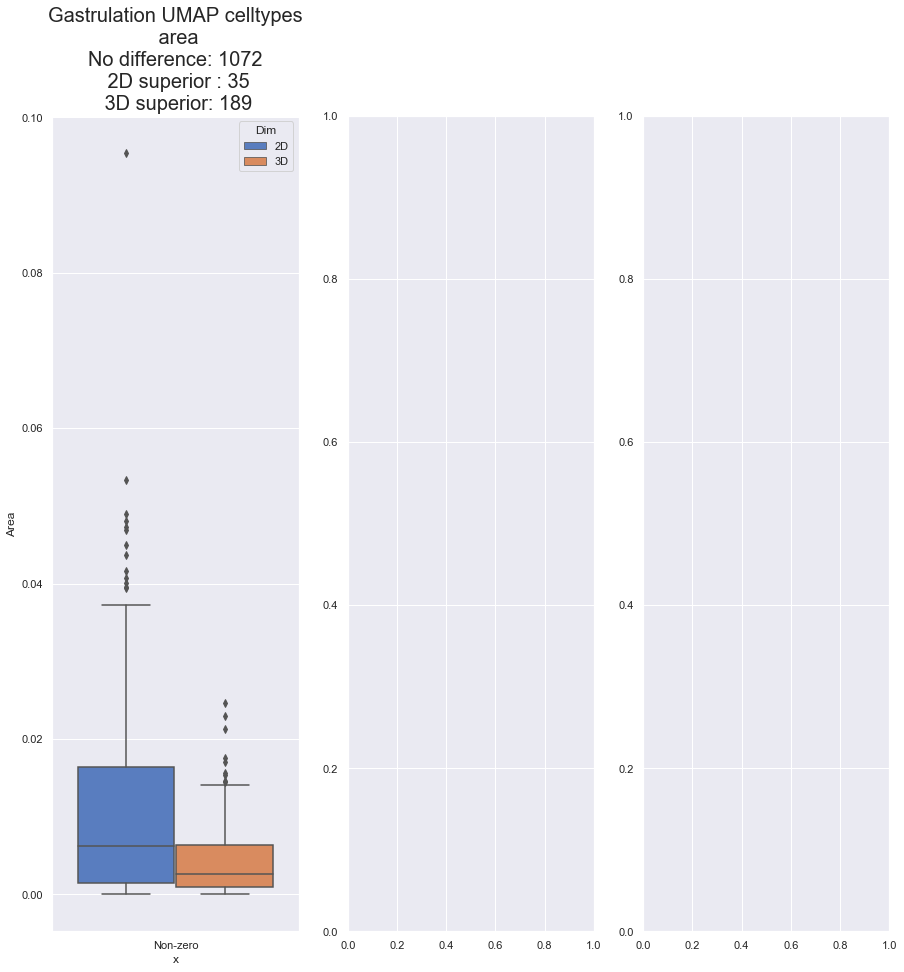

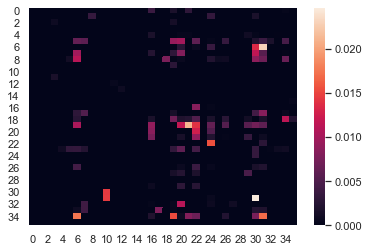

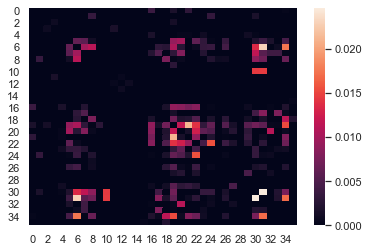

In [49]:
#print("filtered celltype")
#create_side_by_side_boxplots(dir_3d_filtered + "/" + path_celltype, dir_2d_filtered + "/" + path_celltype)
print("unfiltered celltype")
df_1 = create_side_by_side_boxplots(dir_3d_unfiltered + "/" + path_celltype, dir_2d_unfiltered + "/" + path_celltype)
#print("filtered cluster")
#create_side_by_side_boxplots(dir_3d_filtered + "/" + path_cluster, dir_2d_filtered + "/" + path_cluster)
#print("unfiltered cluster")
#create_side_by_side_boxplots(dir_3d_unfiltered + "/" + path_cluster, dir_2d_unfiltered + "/" + path_cluster)
plt.figure()
sns.heatmap(df_1)
df_1_above_zero = df_1[df_1>0]
print("above zero " + str(len(df_1_above_zero)))
df_1+=df_1.T
plt.figure()
sns.heatmap(df_1)
df_1_above_zero = df_1[df_1>0]
print("above zero after adding transponate " + str(len(df_1_above_zero)))

with_angles_3/3d_gas_umap_filtered/overlapping_areas_result_celltype.txt
and
with_angles_3/2d_gas_umap_filtered/overlapping_areas_result_celltype.txt


mean of non-zero values in difference in area 0.00029491212145035675
median of non-zero values in difference in area 8.107244e-05


mean of non-zero values in difference in worst percentage 6.534457687478875e-05
median of non-zero values in difference in worst percentage -0.0001657325


with_angles_3/3d_gas_umap_unfiltered/overlapping_areas_result_celltype.txt
and
with_angles_3/2d_gas_umap_unfiltered/overlapping_areas_result_celltype.txt


mean of non-zero values in difference in area 0.007563014759345983
median of non-zero values in difference in area 0.0030412736


mean of non-zero values in difference in worst percentage 0.0024326681532485877
median of non-zero values in difference in worst percentage -0.0001309626




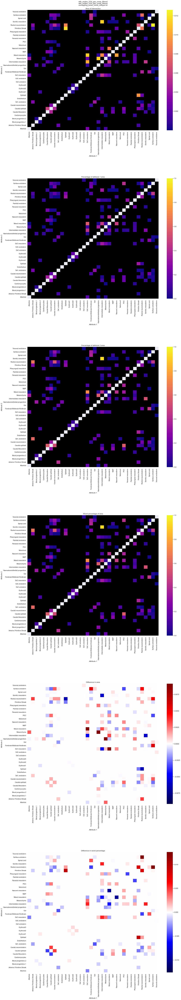

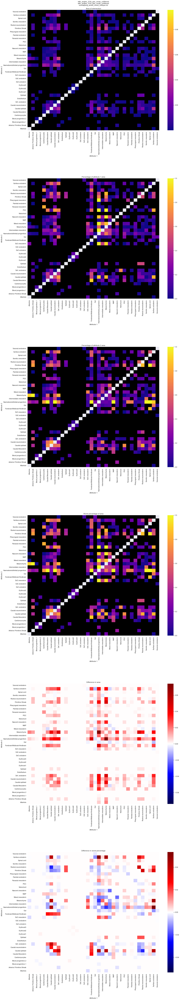

In [26]:
create_heatmaps(dir_3d_filtered, dir_2d_filtered, path_celltype)
create_heatmaps(dir_3d_unfiltered, dir_2d_unfiltered, path_celltype)

with_angles_3/3d_gas_umap_filtered/overlapping_areas_result_cluster.txt
and
with_angles_3/2d_gas_umap_filtered/overlapping_areas_result_cluster.txt


mean of non-zero values in difference in area 0.0009511360466651162
median of non-zero values in difference in area -3.356979999999995e-05


mean of non-zero values in difference in worst percentage 0.0018062103693675675
median of non-zero values in difference in worst percentage 0.0006472812


with_angles_3/3d_gas_umap_unfiltered/overlapping_areas_result_cluster.txt
and
with_angles_3/2d_gas_umap_unfiltered/overlapping_areas_result_cluster.txt


mean of non-zero values in difference in area 0.020778174507230768
median of non-zero values in difference in area 0.014440320000000001


mean of non-zero values in difference in worst percentage 0.021158759729757576
median of non-zero values in difference in worst percentage 0.0087717655




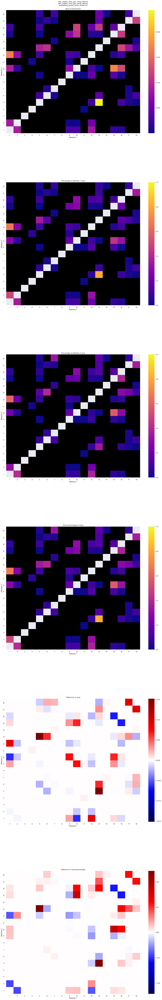

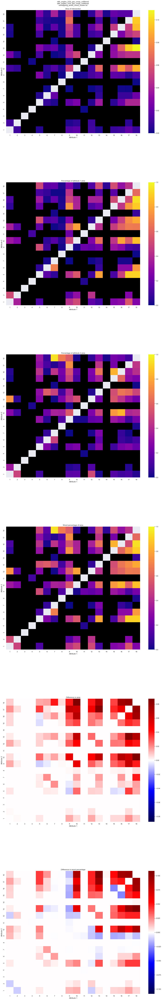

In [27]:
create_heatmaps(dir_3d_filtered, dir_2d_filtered, path_cluster)
create_heatmaps(dir_3d_unfiltered, dir_2d_unfiltered, path_cluster)

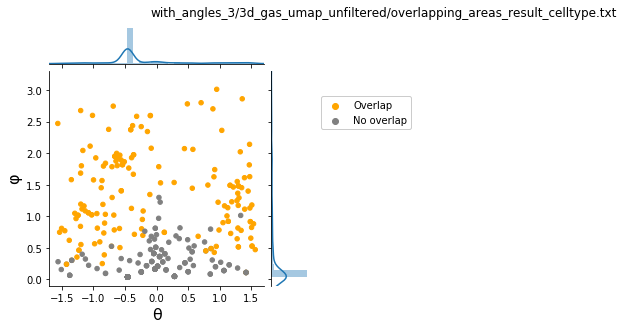

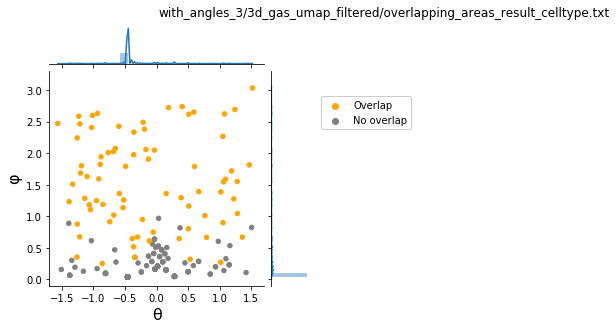

In [11]:
plot_angles(dir_3d_unfiltered + "/" + path_celltype)
plot_angles(dir_3d_filtered + "/" + path_celltype)

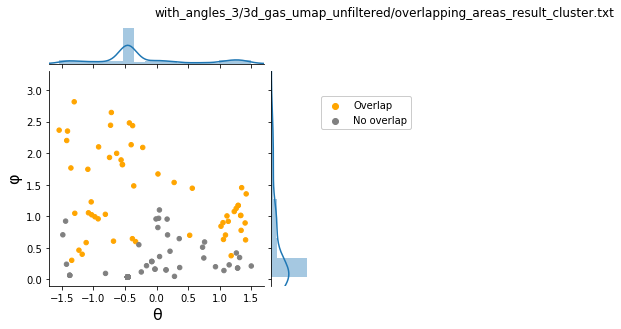

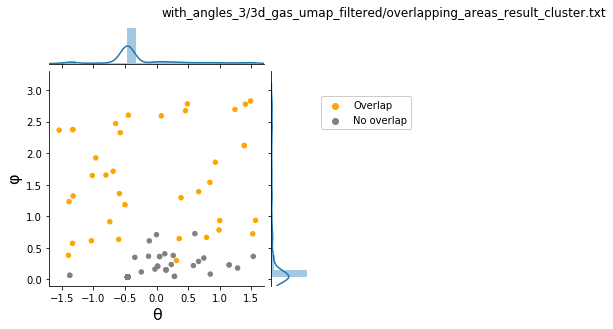

In [12]:
plot_angles(dir_3d_unfiltered + "/" + path_cluster)
plot_angles(dir_3d_filtered + "/" + path_cluster)

# Gastrulation TSNE

In [78]:
dir_2d_filtered = master_dir+"2d_gas_tsne_filtered"
dir_2d_unfiltered = master_dir+"2d_gas_tsne_unfiltered"
dir_3d_filtered = master_dir+"3d_gas_tsne_filtered"
dir_3d_unfiltered = master_dir+"3d_gas_tsne_unfiltered"
path_celltype = "overlapping_areas_result_celltype.txt"
path_cluster = "overlapping_areas_result_cluster.txt"

unfiltered
percentage of attr_1 (-0.043982008149859086, -0.029363549448289058)
percentage of attr_2 (-0.045797939930708985, -0.02866638550657343)
ks-test
Ks_2sampResult(statistic=0.07098765432098765, pvalue=0.0029068424071802238)


unfiltered cluster
percentage of attr_1 (-0.07920222653476779, -0.04446477373004705)
percentage of attr_2 (-0.05919712000705811, -0.021558132955904863)
ks-test
Ks_2sampResult(statistic=0.1111111111111111, pvalue=0.03655545420704698)




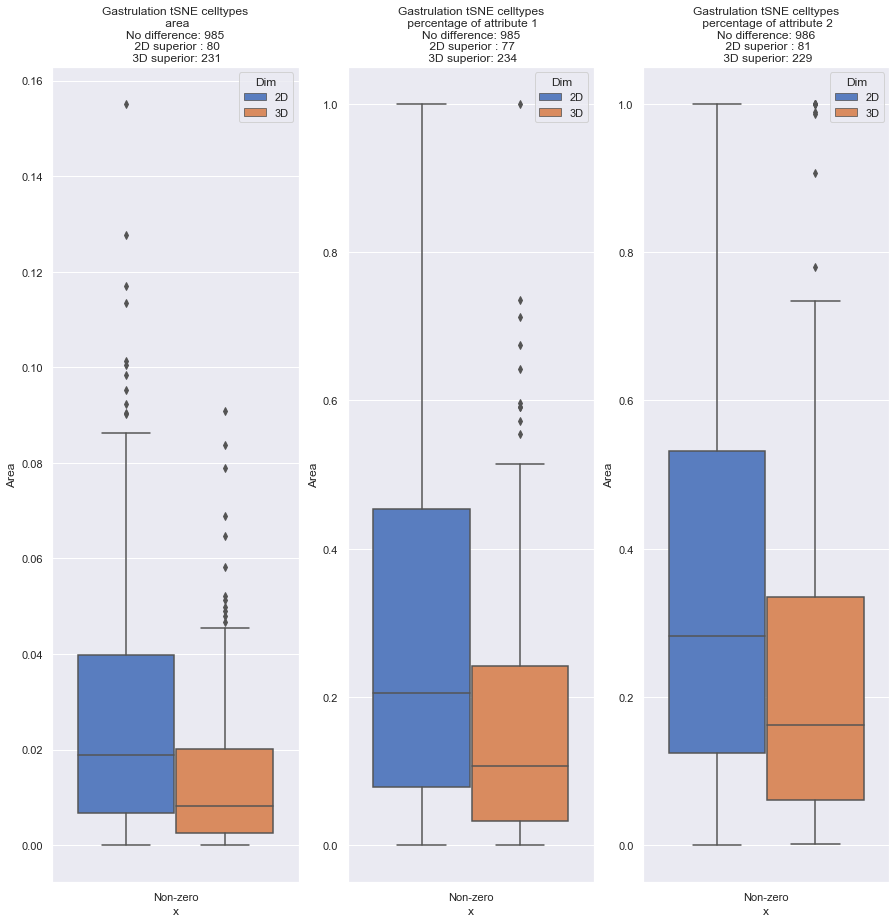

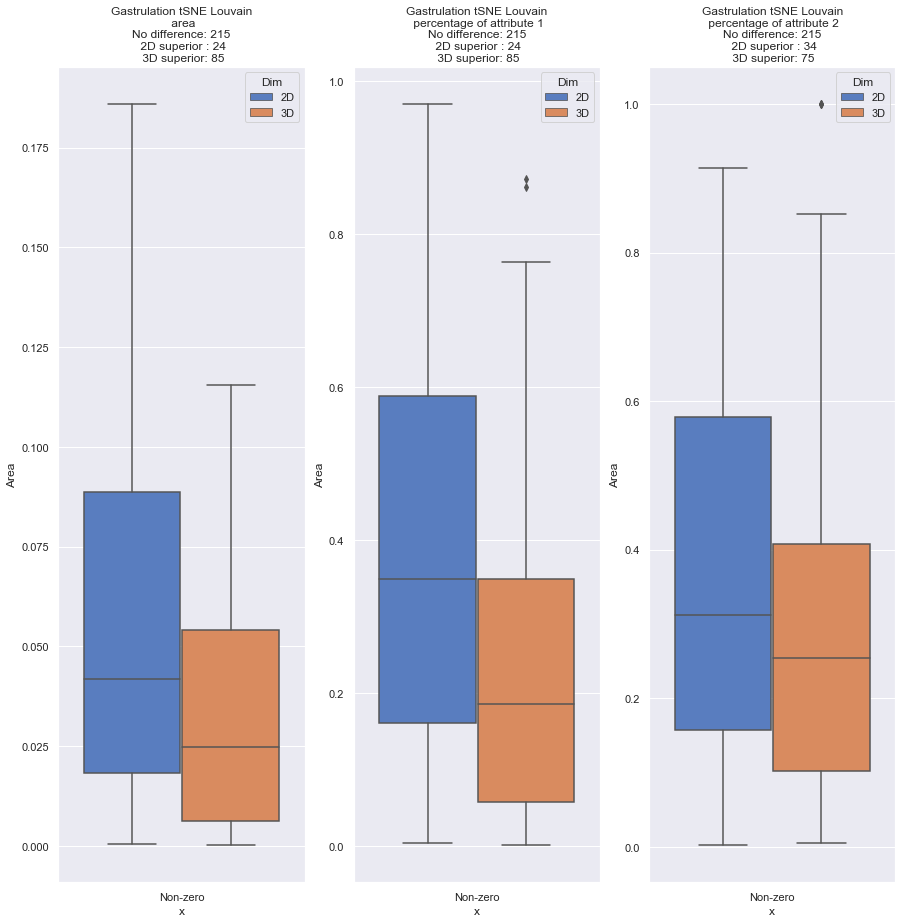

In [79]:
#print("filtered")
#create_side_by_side_boxplots(dir_3d_filtered + "/" + path_celltype, dir_2d_filtered + "/" + path_celltype)
print("unfiltered")
create_side_by_side_boxplots(dir_3d_unfiltered + "/" + path_celltype, dir_2d_unfiltered + "/" + path_celltype)
#print("filtered cluster")
#create_side_by_side_boxplots(dir_3d_filtered + "/" + path_cluster, dir_2d_filtered + "/" + path_cluster)
print("unfiltered cluster")
create_side_by_side_boxplots(dir_3d_unfiltered + "/" + path_cluster, dir_2d_unfiltered + "/" + path_cluster)


with_angles_3/3d_gas_tsne_filtered/overlapping_areas_result_celltype.txt
and
with_angles_3/2d_gas_tsne_filtered/overlapping_areas_result_celltype.txt


mean of non-zero values in difference in area -0.0006540560311123712
median of non-zero values in difference in area -0.0006922173


mean of non-zero values in difference in worst percentage -9.9244458539473e-06
median of non-zero values in difference in worst percentage -0.0005262557999999999


with_angles_3/3d_gas_tsne_unfiltered/overlapping_areas_result_celltype.txt
and
with_angles_3/2d_gas_tsne_unfiltered/overlapping_areas_result_celltype.txt


mean of non-zero values in difference in area 0.014763549922786175
median of non-zero values in difference in area 0.008314647


mean of non-zero values in difference in worst percentage 0.00604418641174249
median of non-zero values in difference in worst percentage -0.0008896258000000001




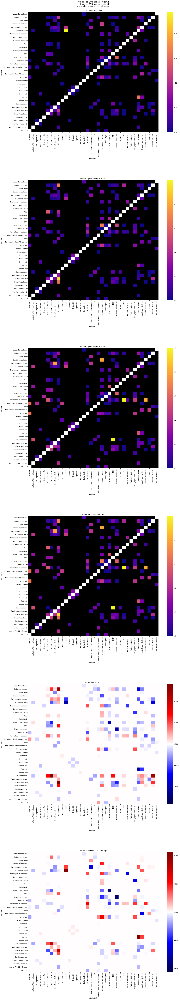

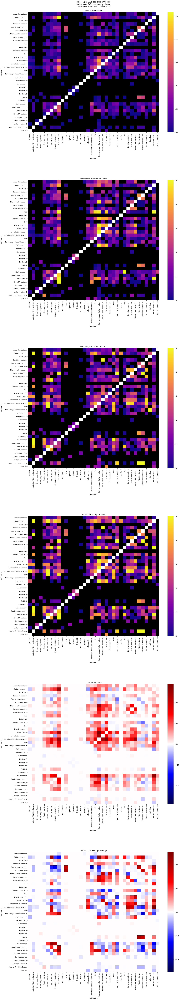

In [15]:
create_heatmaps(dir_3d_filtered, dir_2d_filtered, path_celltype)
create_heatmaps(dir_3d_unfiltered, dir_2d_unfiltered, path_celltype)

with_angles_3/3d_gas_tsne_filtered/overlapping_areas_result_celltype.txt
and
with_angles_3/2d_gas_tsne_filtered/overlapping_areas_result_celltype.txt


mean of non-zero values in difference in area -0.0006540560311123712
median of non-zero values in difference in area -0.0006922173


mean of non-zero values in difference in worst percentage -9.9244458539473e-06
median of non-zero values in difference in worst percentage -0.0005262557999999999


with_angles_3/3d_gas_tsne_unfiltered/overlapping_areas_result_celltype.txt
and
with_angles_3/2d_gas_tsne_unfiltered/overlapping_areas_result_celltype.txt


mean of non-zero values in difference in area 0.014763549922786175
median of non-zero values in difference in area 0.008314647


mean of non-zero values in difference in worst percentage 0.00604418641174249
median of non-zero values in difference in worst percentage -0.0008896258000000001




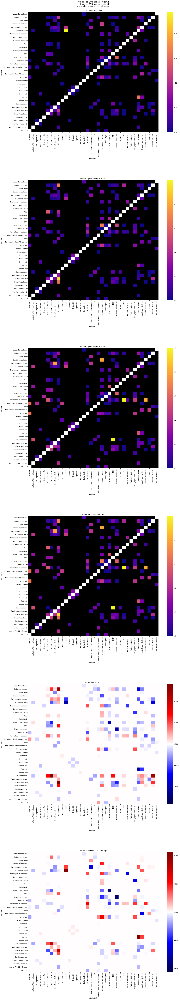

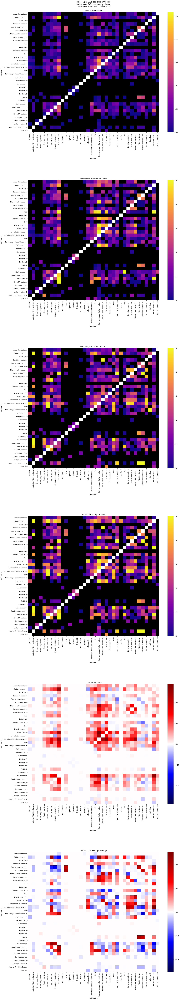

In [16]:
create_heatmaps(dir_3d_filtered, dir_2d_filtered, path_celltype)
create_heatmaps(dir_3d_unfiltered, dir_2d_unfiltered, path_celltype)

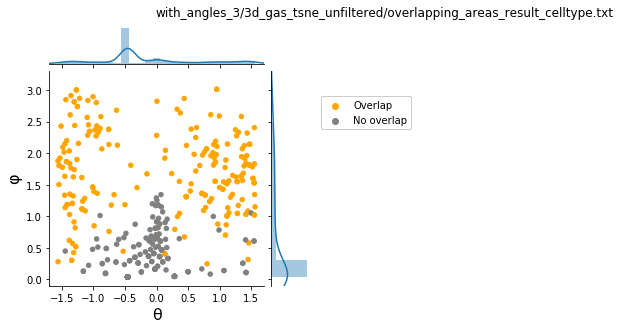

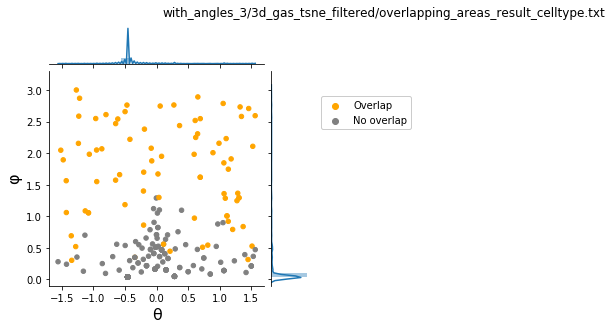

In [17]:
plot_angles(dir_3d_unfiltered + "/" + path_celltype)
plot_angles(dir_3d_filtered + "/" + path_celltype)

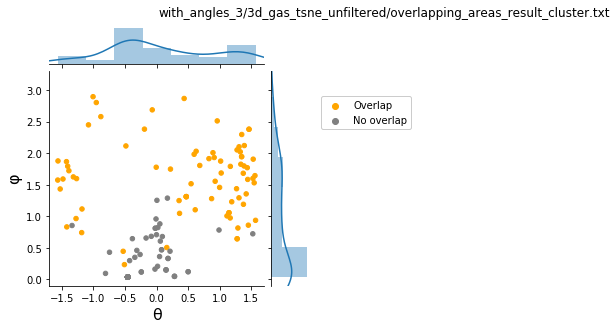

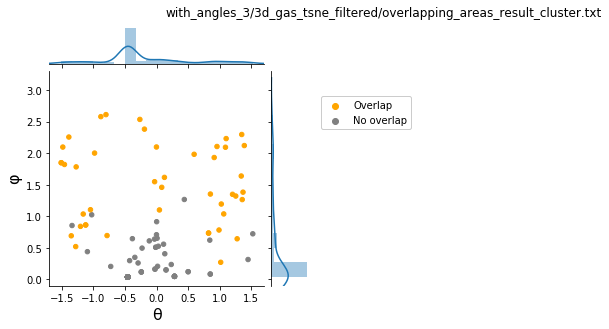

In [18]:
plot_angles(dir_3d_unfiltered + "/" + path_cluster)
plot_angles(dir_3d_filtered + "/" + path_cluster)

# Organogenesis UMAP

In [84]:
dir_2d_filtered = master_dir+"2d_org_umap_filtered"
dir_2d_unfiltered = master_dir+"2d_org_umap_unfiltered"
dir_3d_filtered = master_dir+"3d_org_umap_filtered"
dir_3d_unfiltered = master_dir+"3d_org_umap_unfiltered"
path_celltype = "overlapping_areas_result_Main.cell.type.txt"
path_cluster = "overlapping_areas_result_seurat_clusters.txt"
#path_stage = "overlapping_areas_result_stage.txt"


unfiltered
percentage of attr_1 (-0.08060963776370536, -0.06267088520675759)
percentage of attr_2 (-0.0995155413355108, -0.07899042670489043)
ks-test
Ks_2sampResult(statistic=0.11342592592592593, pvalue=1.1142338198297264e-07)


unfiltered cluster
percentage of attr_1 (-0.0566734777344367, -0.031919764517510364)
percentage of attr_2 (-0.0894047023344009, -0.05758682177728152)
ks-test
Ks_2sampResult(statistic=0.08128544423440454, pvalue=0.06064607979383179)




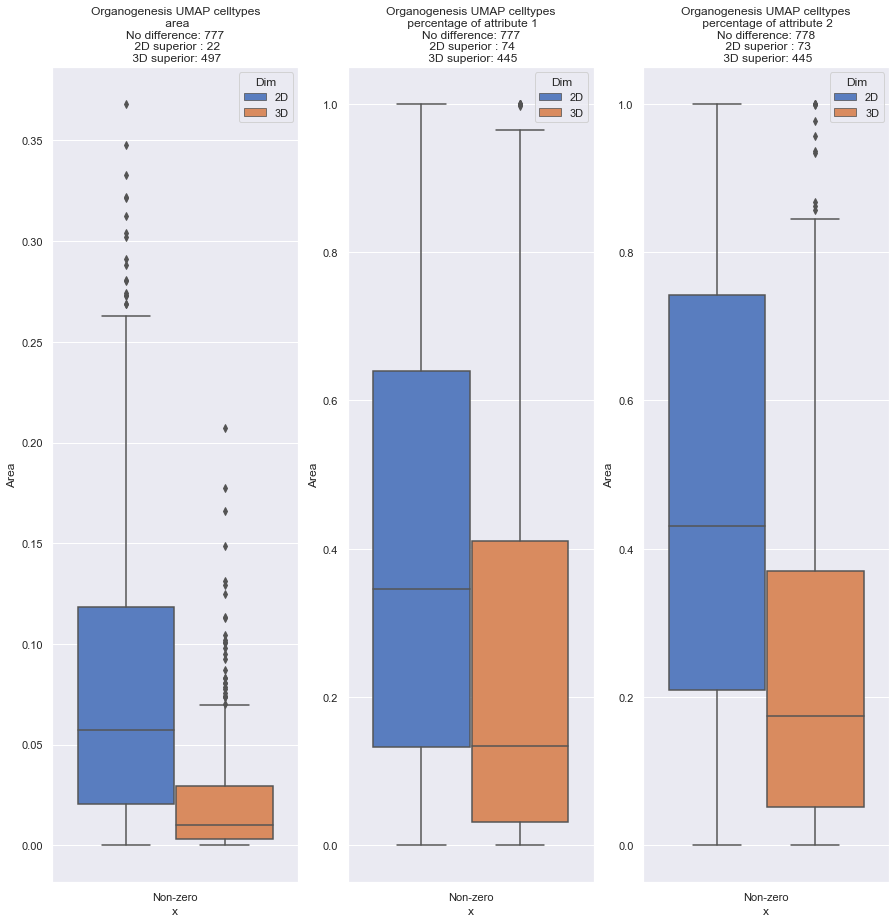

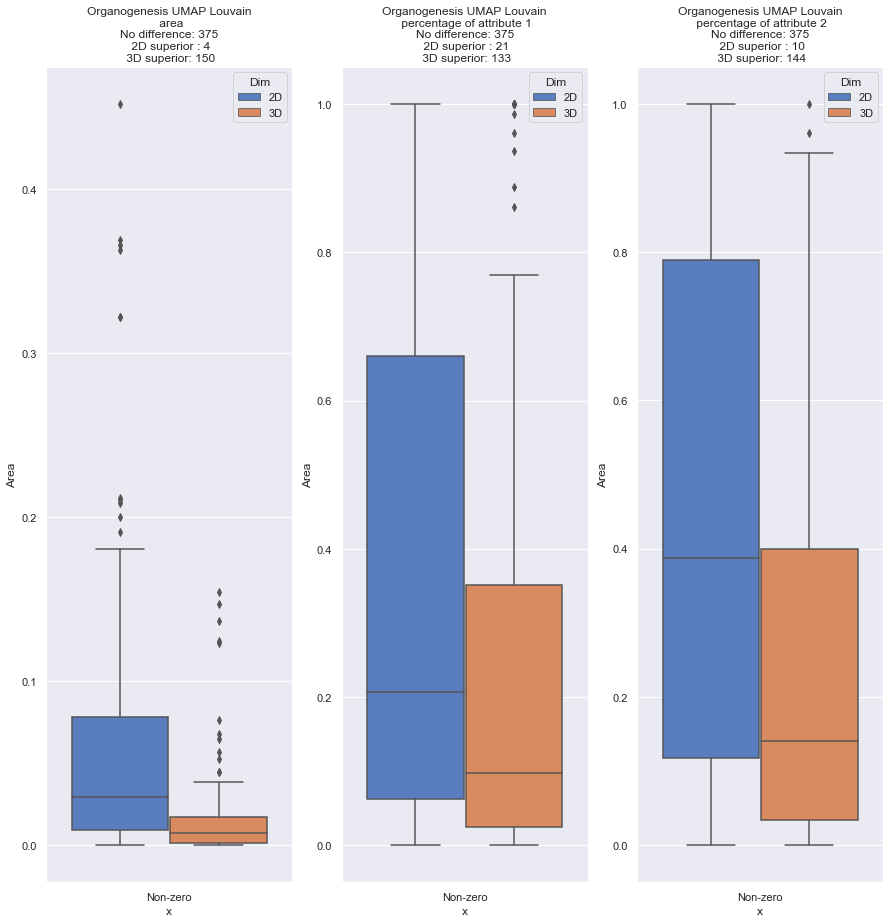

In [87]:
#print("filtered")
#create_side_by_side_boxplots(dir_3d_filtered + "/" + path_celltype, dir_2d_filtered + "/" + path_celltype)
print("unfiltered")
create_side_by_side_boxplots(dir_3d_unfiltered + "/" + path_celltype, dir_2d_unfiltered + "/" + path_celltype)
#print("filtered cluster")
#create_side_by_side_boxplots(dir_3d_filtered + "/" + path_cluster, dir_2d_filtered + "/" + path_cluster)
print("unfiltered cluster")
create_side_by_side_boxplots(dir_3d_unfiltered + "/" + path_cluster, dir_2d_unfiltered + "/" + path_cluster)


with_angles_3/3d_org_umap_filtered/overlapping_areas_result_seurat_clusters.txt
and
with_angles_3/2d_org_umap_filtered/overlapping_areas_result_seurat_clusters.txt


mean of non-zero values in difference in area 0.003399668793803571
median of non-zero values in difference in area 0.0019816849500000006


mean of non-zero values in difference in worst percentage 0.0039603948231875
median of non-zero values in difference in worst percentage 0.0027730785


with_angles_3/3d_org_umap_unfiltered/overlapping_areas_result_seurat_clusters.txt
and
with_angles_3/2d_org_umap_unfiltered/overlapping_areas_result_seurat_clusters.txt


mean of non-zero values in difference in area 0.04654486346973377
median of non-zero values in difference in area 0.024722442499999997


mean of non-zero values in difference in worst percentage 0.02980711513646853
median of non-zero values in difference in worst percentage 0.007095085




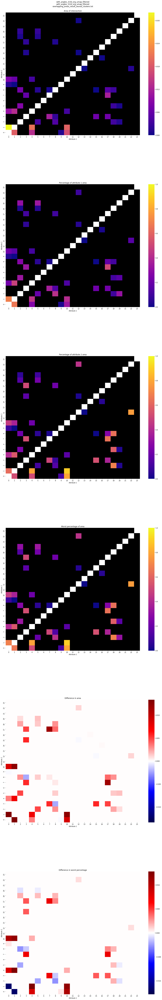

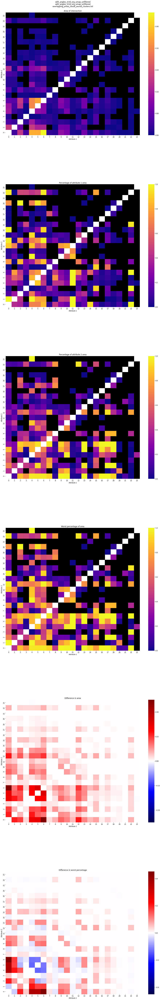

In [21]:
create_heatmaps(dir_3d_filtered, dir_2d_filtered, path_cluster)
create_heatmaps(dir_3d_unfiltered, dir_2d_unfiltered, path_cluster)

with_angles_3/3d_org_umap_filtered/overlapping_areas_result_Main.cell.type.txt
and
with_angles_3/2d_org_umap_filtered/overlapping_areas_result_Main.cell.type.txt


mean of non-zero values in difference in area 0.006296937408050724
median of non-zero values in difference in area 0.003267522500000001


mean of non-zero values in difference in worst percentage 0.005635868152578513
median of non-zero values in difference in worst percentage 0.0009140769


with_angles_3/3d_org_umap_unfiltered/overlapping_areas_result_Main.cell.type.txt
and
with_angles_3/2d_org_umap_unfiltered/overlapping_areas_result_Main.cell.type.txt


mean of non-zero values in difference in area 0.05791399466571291
median of non-zero values in difference in area 0.04153213


mean of non-zero values in difference in worst percentage 0.043895008923237805
median of non-zero values in difference in worst percentage 0.011579545




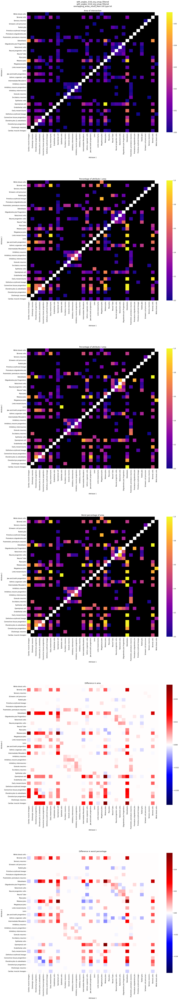

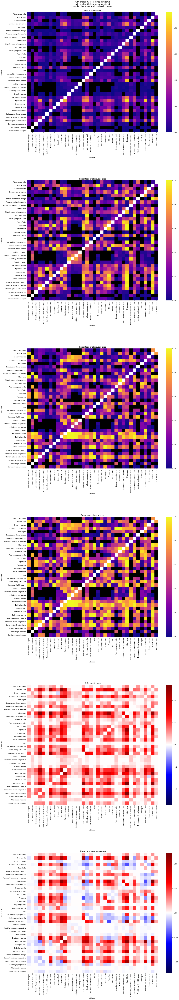

In [22]:
create_heatmaps(dir_3d_filtered, dir_2d_filtered, path_celltype)
create_heatmaps(dir_3d_unfiltered, dir_2d_unfiltered, path_celltype)

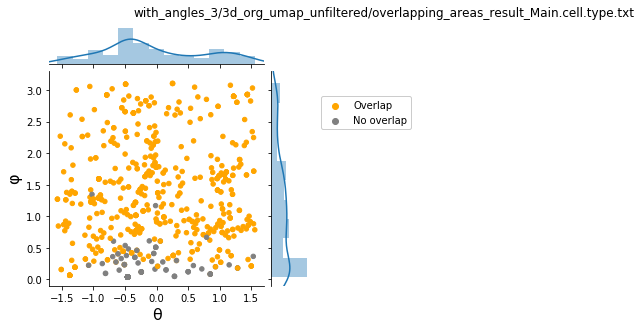

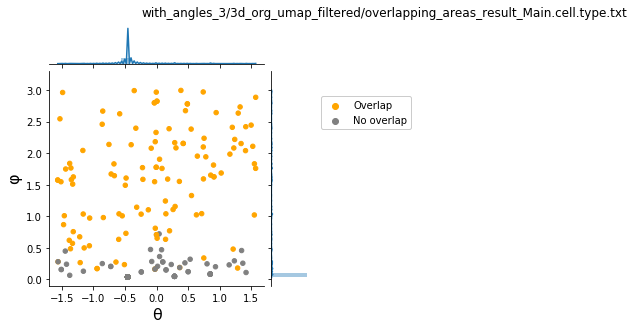

In [23]:
plot_angles(dir_3d_unfiltered + "/" + path_celltype)
plot_angles(dir_3d_filtered + "/" + path_celltype)

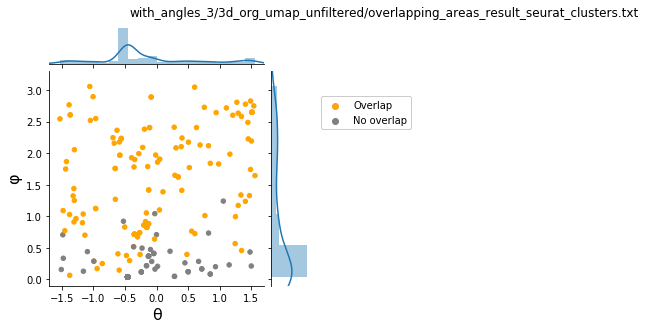

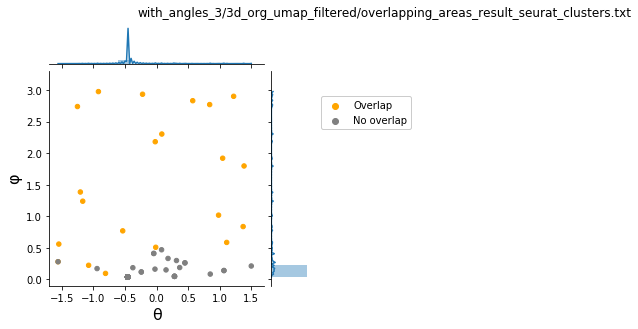

In [24]:
plot_angles(dir_3d_unfiltered + "/" + path_cluster)
plot_angles(dir_3d_filtered + "/" + path_cluster)

# Organogenesis tSNE

In [90]:
dir_2d_filtered = master_dir+"2d_org_tsne_filtered"
dir_2d_unfiltered = master_dir+"2d_org_tsne_unfiltered"
dir_3d_filtered = master_dir+"3d_org_tsne_filtered"
dir_3d_unfiltered = master_dir+"3d_org_tsne_unfiltered"
path_celltype = "overlapping_areas_result_Main.cell.type.txt"
path_cluster = "overlapping_areas_result_seurat_clusters.txt"
#path_stage = "overlapping_areas_result_stage.txt"

unfiltered
percentage of attr_1 (-0.07119744555695372, -0.05375591850165584)
percentage of attr_2 (-0.07329396705061643, -0.05421625826372155)
ks-test
Ks_2sampResult(statistic=0.09953703703703703, pvalue=5.2177691398763735e-06)


unfiltered cluster
percentage of attr_1 (-0.01293955352990939, 0.010713978047527543)
percentage of attr_2 (-0.012553816879073561, 0.01461538341839303)
ks-test
Ks_2sampResult(statistic=0.022684310018903593, pvalue=0.9992337029366792)




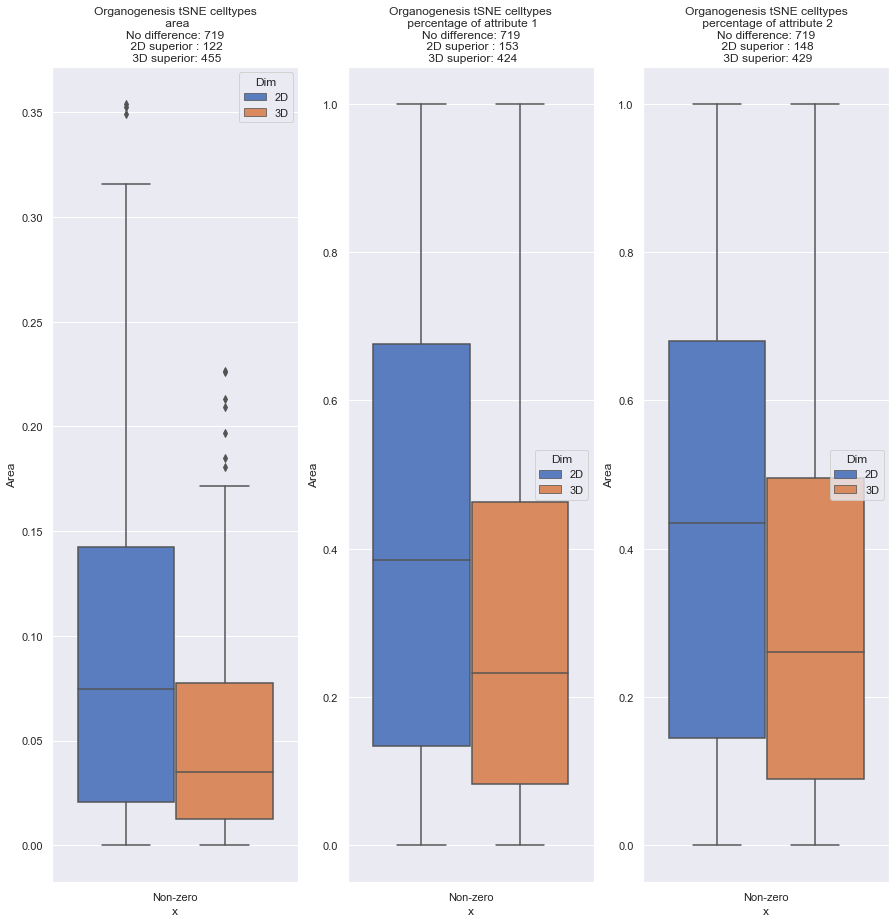

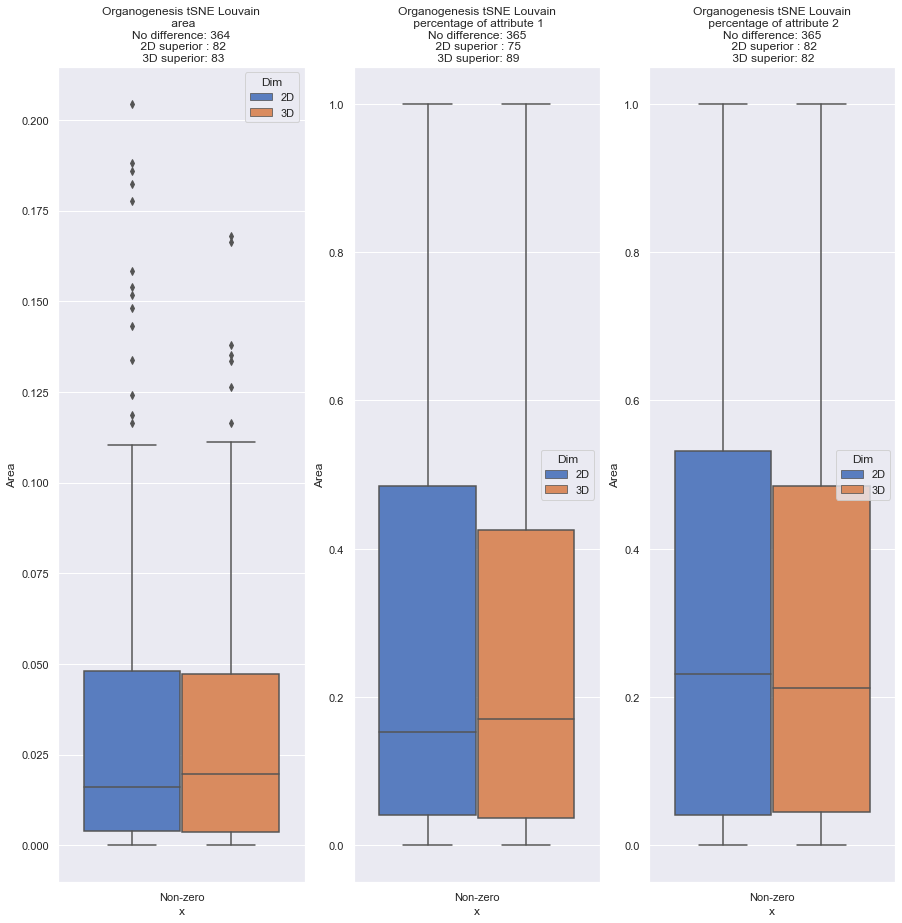

In [91]:
#print("filtered")
#create_side_by_side_boxplots(dir_3d_filtered + "/" + path_celltype, dir_2d_filtered + "/" + path_celltype)
print("unfiltered")
create_side_by_side_boxplots(dir_3d_unfiltered + "/" + path_celltype, dir_2d_unfiltered + "/" + path_celltype)
#print("filtered cluster")
#create_side_by_side_boxplots(dir_3d_filtered + "/" + path_cluster, dir_2d_filtered + "/" + path_cluster)
print("unfiltered cluster")
create_side_by_side_boxplots(dir_3d_unfiltered + "/" + path_cluster, dir_2d_unfiltered + "/" + path_cluster)


with_angles_3/3d_org_tsne_filtered/overlapping_areas_result_Main.cell.type.txt
and
with_angles_3/2d_org_tsne_filtered/overlapping_areas_result_Main.cell.type.txt


mean of non-zero values in difference in area 0.0053921432179041455
median of non-zero values in difference in area 0.0020062640000000007


mean of non-zero values in difference in worst percentage 0.014814497247860929
median of non-zero values in difference in worst percentage 0.002210137


with_angles_3/3d_org_tsne_unfiltered/overlapping_areas_result_Main.cell.type.txt
and
with_angles_3/2d_org_tsne_unfiltered/overlapping_areas_result_Main.cell.type.txt


mean of non-zero values in difference in area 0.040875688792146266
median of non-zero values in difference in area 0.026979089


mean of non-zero values in difference in worst percentage 0.03807788026606742
median of non-zero values in difference in worst percentage 0.0077581905




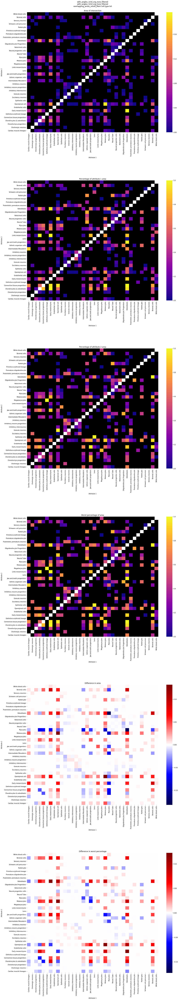

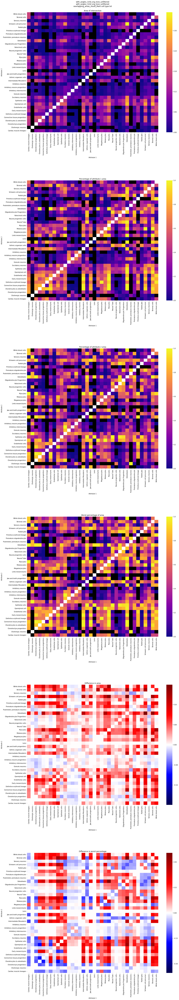

In [27]:
create_heatmaps(dir_3d_filtered, dir_2d_filtered, path_celltype)
create_heatmaps(dir_3d_unfiltered, dir_2d_unfiltered, path_celltype)

with_angles_3/3d_org_tsne_filtered/overlapping_areas_result_seurat_clusters.txt
and
with_angles_3/2d_org_tsne_filtered/overlapping_areas_result_seurat_clusters.txt


mean of non-zero values in difference in area -0.001203159827163921
median of non-zero values in difference in area 0.0001707577


mean of non-zero values in difference in worst percentage 0.0002268407985037837
median of non-zero values in difference in worst percentage 0.0007727277000000001


with_angles_3/3d_org_tsne_unfiltered/overlapping_areas_result_seurat_clusters.txt
and
with_angles_3/2d_org_tsne_unfiltered/overlapping_areas_result_seurat_clusters.txt


mean of non-zero values in difference in area 0.0036670282567830307
median of non-zero values in difference in area 3.4070190000000004e-07


mean of non-zero values in difference in worst percentage 0.010468769645087502
median of non-zero values in difference in worst percentage 0.0009769084




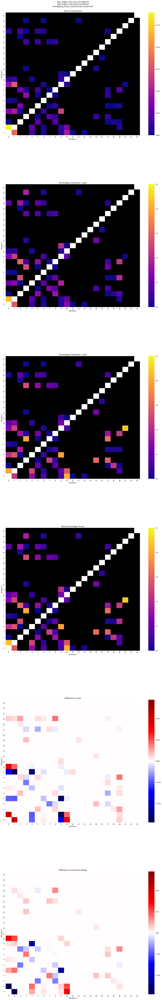

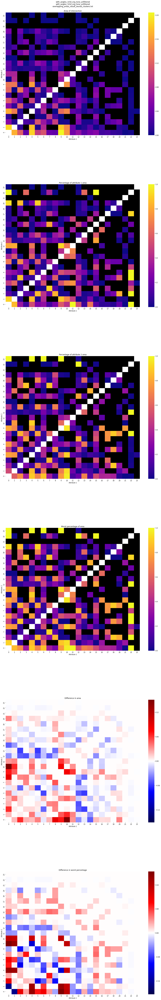

In [28]:
create_heatmaps(dir_3d_filtered, dir_2d_filtered, path_cluster)
create_heatmaps(dir_3d_unfiltered, dir_2d_unfiltered, path_cluster)

C:\Users\vrproject\Anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


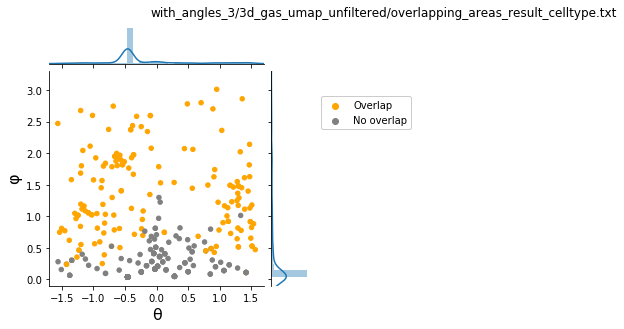

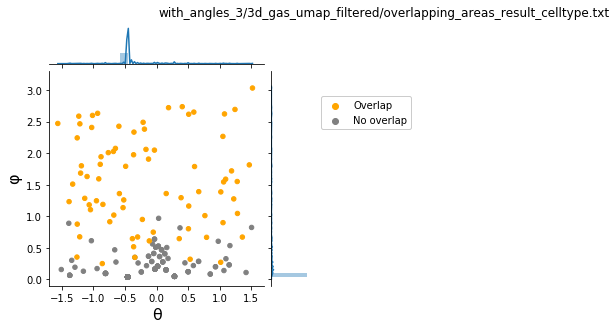

In [8]:
plot_angles(dir_3d_unfiltered + "/" + path_celltype)
plot_angles(dir_3d_filtered + "/" + path_celltype)

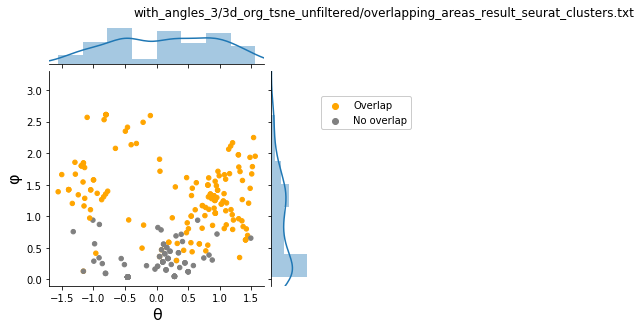

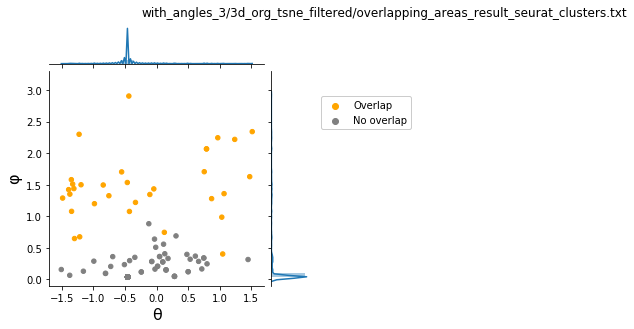

In [30]:
plot_angles(dir_3d_unfiltered + "/" + path_cluster)
plot_angles(dir_3d_filtered + "/" + path_cluster)


# MCA UMAP

In [92]:
dir_2d_filtered = master_dir+"2d_mca_umap_filtered"
dir_2d_unfiltered = master_dir+"2d_mca_umap_unfiltered"
dir_3d_filtered = master_dir+"3d_mca_umap_filtered"
dir_3d_unfiltered = master_dir+"3d_mca_umap_unfiltered"
path_celltype = "overlapping_areas_result_Tissue.txt"
path_cluster = "overlapping_areas_result_seurat_clusters.txt"
#path_stage = "overlapping_areas_result_stage.txt"

unfiltered
percentage of attr_1 (-0.0926789973530152, -0.07389934779500835)
percentage of attr_2 (-0.09150836431148247, -0.07255895580629872)
ks-test
Ks_2sampResult(statistic=0.11426592797783934, pvalue=1.2526678941968805e-08)


unfiltered cluster
percentage of attr_1 (-0.06497695710155935, -0.053022732689380944)
percentage of attr_2 (-0.10484609307484577, -0.0871589078295199)
ks-test
Ks_2sampResult(statistic=0.1416076634735527, pvalue=2.1143318319611094e-21)




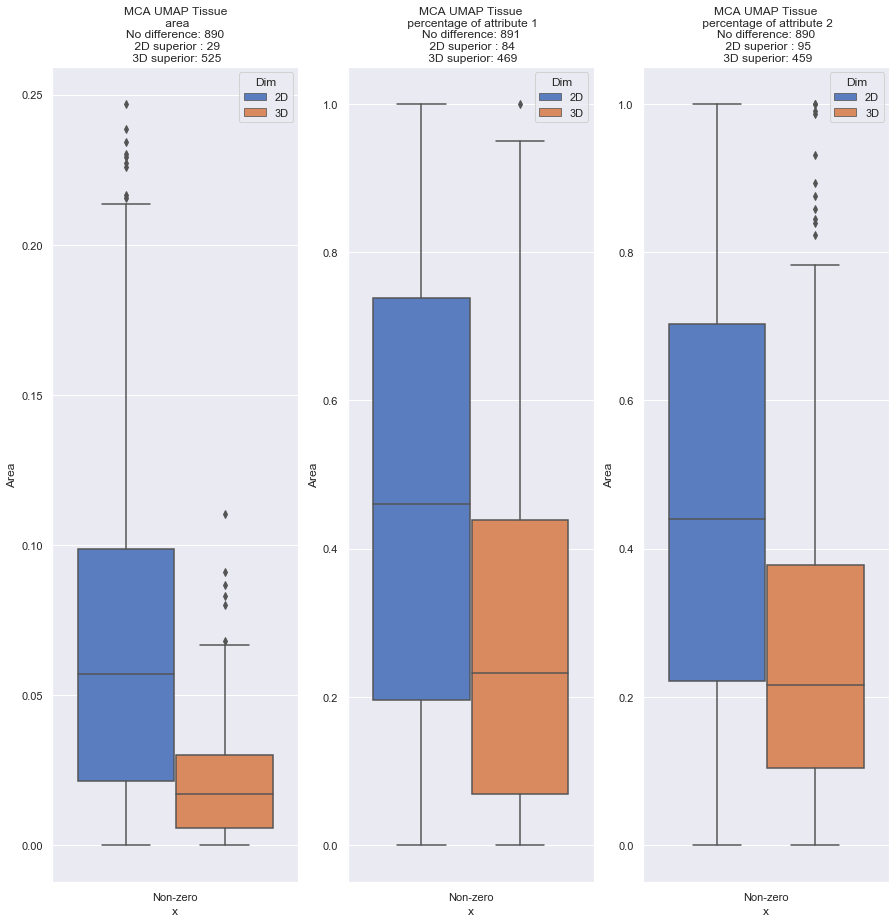

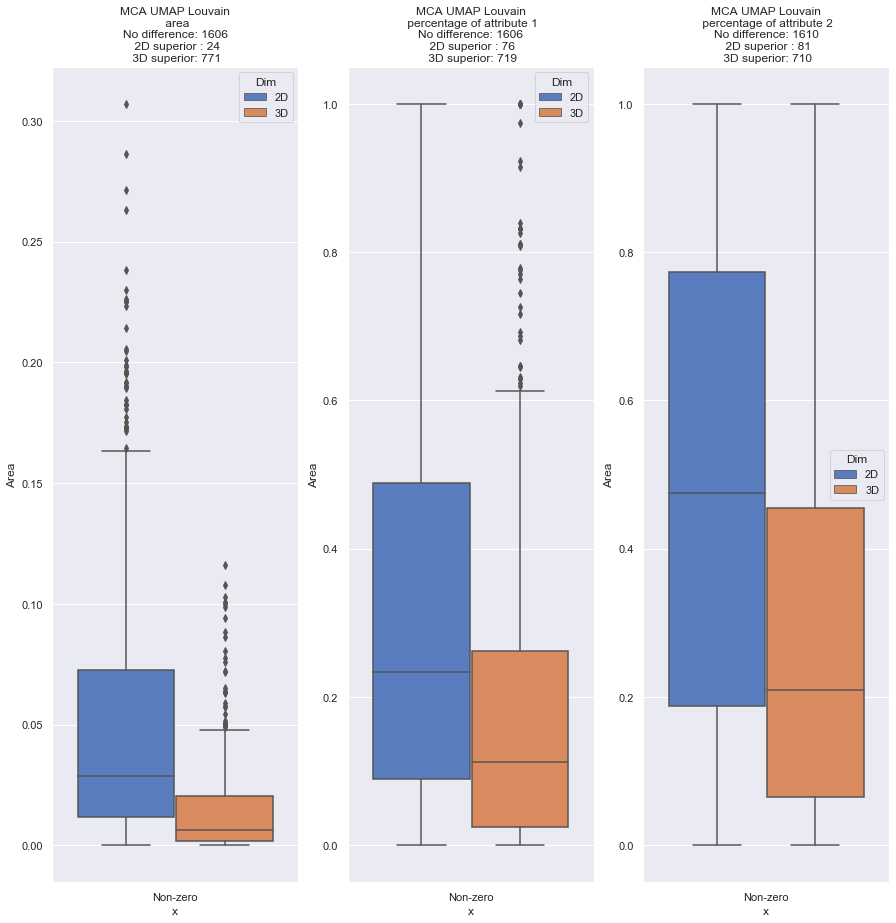

In [96]:
#print("filtered")
#create_side_by_side_boxplots(dir_3d_filtered + "/" + path_celltype, dir_2d_filtered + "/" + path_celltype)
print("unfiltered")
create_side_by_side_boxplots(dir_3d_unfiltered + "/" + path_celltype, dir_2d_unfiltered + "/" + path_celltype)
#print("filtered cluster")
#create_side_by_side_boxplots(dir_3d_filtered + "/" + path_cluster, dir_2d_filtered + "/" + path_cluster)
print("unfiltered cluster")
create_side_by_side_boxplots(dir_3d_unfiltered + "/" + path_cluster, dir_2d_unfiltered + "/" + path_cluster)


with_angles_3/3d_mca_umap_filtered/overlapping_areas_result_Tissue.txt
and
with_angles_3/2d_mca_umap_filtered/overlapping_areas_result_Tissue.txt


mean of non-zero values in difference in area 0.00558822241626354
median of non-zero values in difference in area 0.0023132008499999997


mean of non-zero values in difference in worst percentage 0.012109059287030498
median of non-zero values in difference in worst percentage 0.0065794815


with_angles_3/3d_mca_umap_unfiltered/overlapping_areas_result_Tissue.txt
and
with_angles_3/2d_mca_umap_unfiltered/overlapping_areas_result_Tissue.txt


mean of non-zero values in difference in area 0.04619725521765578
median of non-zero values in difference in area 0.034766605


mean of non-zero values in difference in worst percentage 0.06282560280524072
median of non-zero values in difference in worst percentage 0.05298194




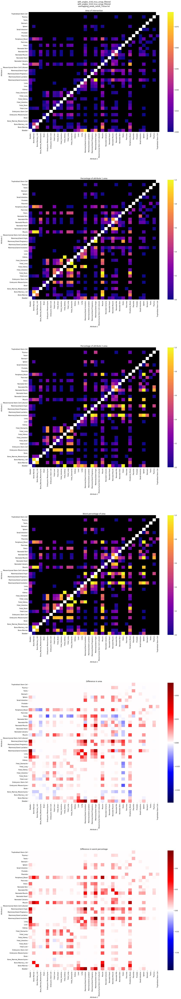

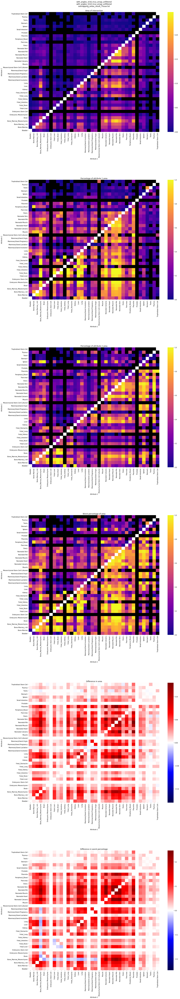

In [33]:
create_heatmaps(dir_3d_filtered, dir_2d_filtered, path_celltype)
create_heatmaps(dir_3d_unfiltered, dir_2d_unfiltered, path_celltype)

with_angles_3/3d_mca_umap_filtered/overlapping_areas_result_seurat_clusters.txt
and
with_angles_3/2d_mca_umap_filtered/overlapping_areas_result_seurat_clusters.txt


mean of non-zero values in difference in area 0.004411836144476087
median of non-zero values in difference in area 0.0013903569499999994


mean of non-zero values in difference in worst percentage 0.004692192671933332
median of non-zero values in difference in worst percentage 0.001226398


with_angles_3/3d_mca_umap_unfiltered/overlapping_areas_result_seurat_clusters.txt
and
with_angles_3/2d_mca_umap_unfiltered/overlapping_areas_result_seurat_clusters.txt


mean of non-zero values in difference in area 0.04001971588323369
median of non-zero values in difference in area 0.02336285


mean of non-zero values in difference in worst percentage 0.0263854529552
median of non-zero values in difference in worst percentage 0.01090806




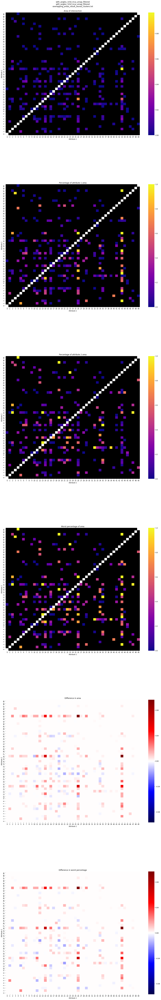

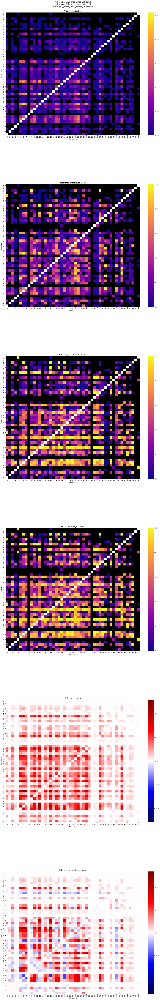

In [34]:
create_heatmaps(dir_3d_filtered, dir_2d_filtered, path_cluster)
create_heatmaps(dir_3d_unfiltered, dir_2d_unfiltered, path_cluster)

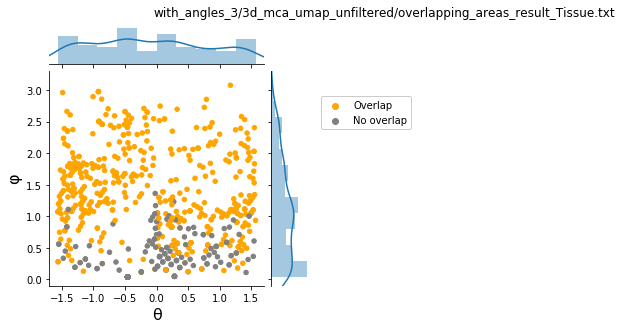

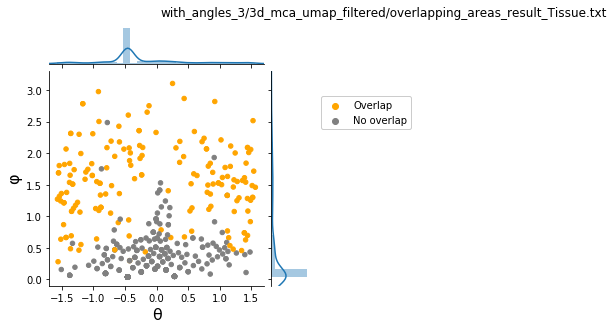

In [35]:
plot_angles(dir_3d_unfiltered + "/" + path_celltype)
plot_angles(dir_3d_filtered + "/" + path_celltype)

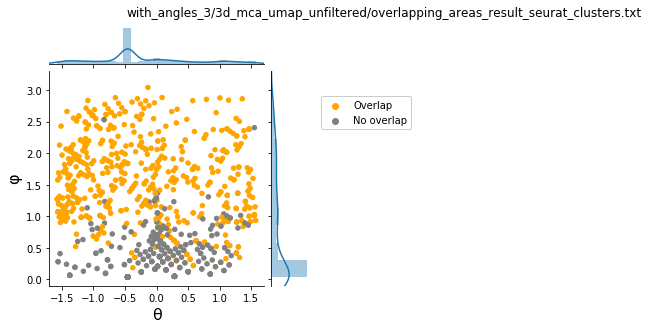

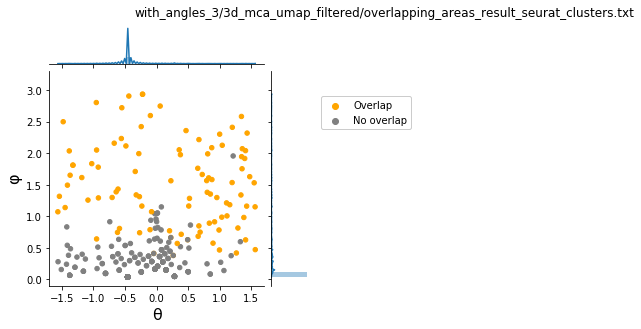

In [36]:
plot_angles(dir_3d_unfiltered + "/" + path_cluster)
plot_angles(dir_3d_filtered + "/" + path_cluster)

# MCA TSNE

In [97]:
dir_2d_filtered = master_dir+"2d_mca_tsne_filtered"
dir_2d_unfiltered = master_dir+"2d_mca_tsne_unfiltered"
dir_3d_filtered = master_dir+"3d_mca_tsne_filtered"
dir_3d_unfiltered = master_dir+"3d_mca_tsne_unfiltered"
path_celltype = "overlapping_areas_result_Tissue.txt"
path_cluster = "overlapping_areas_result_seurat_clusters.txt"
#path_stage = "overlapping_areas_result_stage.txt"

unfiltered
percentage of attr_1 (-0.1138369934498743, -0.09225793891605366)
percentage of attr_2 (-0.10545562522348098, -0.08414214724826416)
ks-test
Ks_2sampResult(statistic=0.15997229916897507, pvalue=1.544370951604656e-16)


unfiltered cluster
percentage of attr_1 (-0.13823363326128138, -0.11909955232678895)
percentage of attr_2 (-0.11191831792426958, -0.092010211112331)
ks-test
Ks_2sampResult(statistic=0.1874219075385256, pvalue=2.9036700878768283e-37)




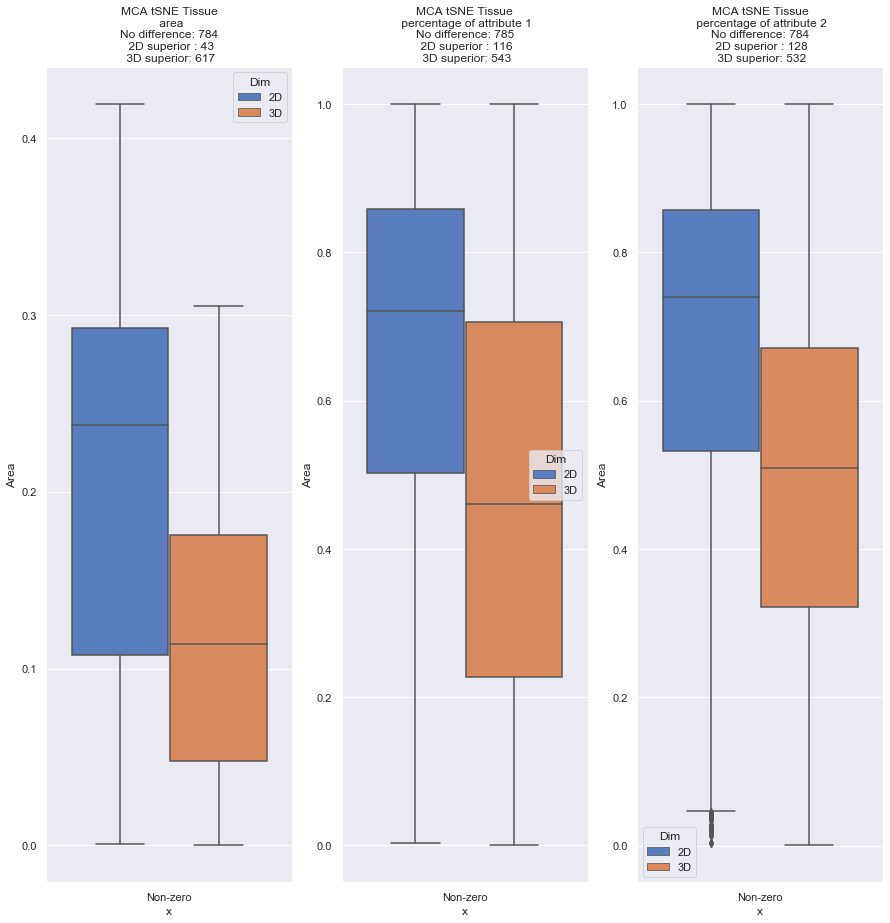

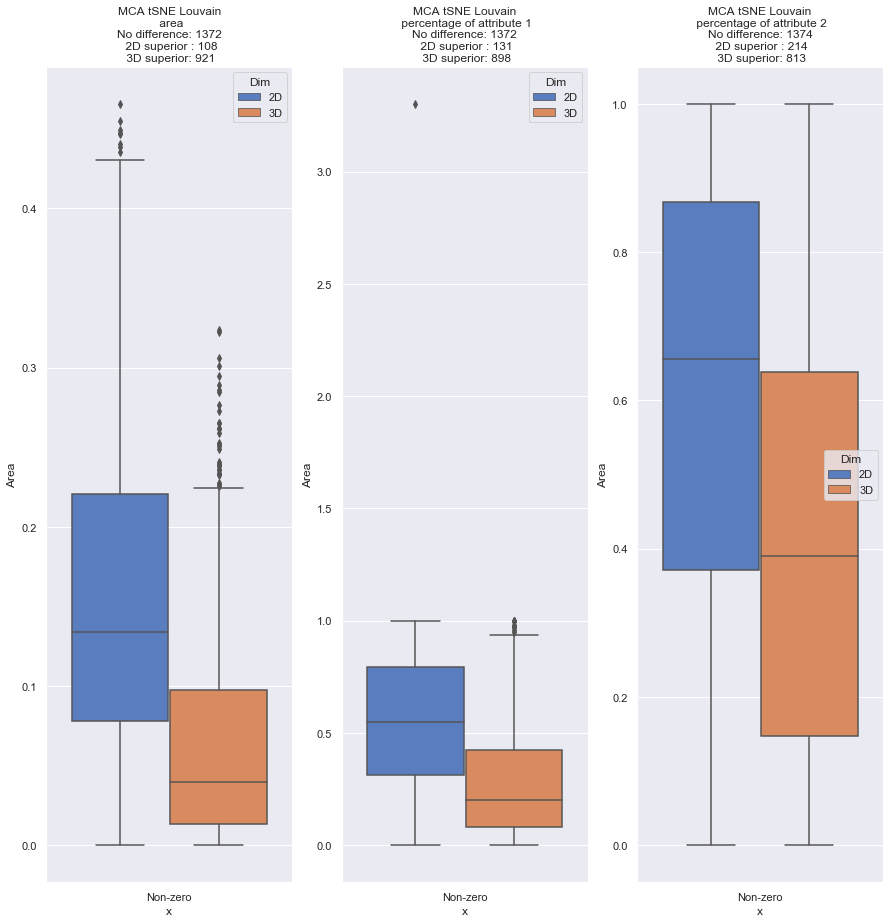

In [98]:
#print("filtered")
#create_side_by_side_boxplots(dir_3d_filtered + "/" + path_celltype, dir_2d_filtered + "/" + path_celltype)
print("unfiltered")
create_side_by_side_boxplots(dir_3d_unfiltered + "/" + path_celltype, dir_2d_unfiltered + "/" + path_celltype)
#print("filtered cluster")
#create_side_by_side_boxplots(dir_3d_filtered + "/" + path_cluster, dir_2d_filtered + "/" + path_cluster)
print("unfiltered cluster")
create_side_by_side_boxplots(dir_3d_unfiltered + "/" + path_cluster, dir_2d_unfiltered + "/" + path_cluster)


with_angles_3/3d_mca_tsne_filtered/overlapping_areas_result_Tissue.txt
and
with_angles_3/2d_mca_tsne_filtered/overlapping_areas_result_Tissue.txt


mean of non-zero values in difference in area 0.02955398794117757
median of non-zero values in difference in area 0.01442815


mean of non-zero values in difference in worst percentage 0.07744857770556746
median of non-zero values in difference in worst percentage 0.05097564


with_angles_3/3d_mca_tsne_unfiltered/overlapping_areas_result_Tissue.txt
and
with_angles_3/2d_mca_tsne_unfiltered/overlapping_areas_result_Tissue.txt


mean of non-zero values in difference in area 0.1004871337104091
median of non-zero values in difference in area 0.09538475999999999


mean of non-zero values in difference in worst percentage 0.1946486797818043
median of non-zero values in difference in worst percentage 0.23340165




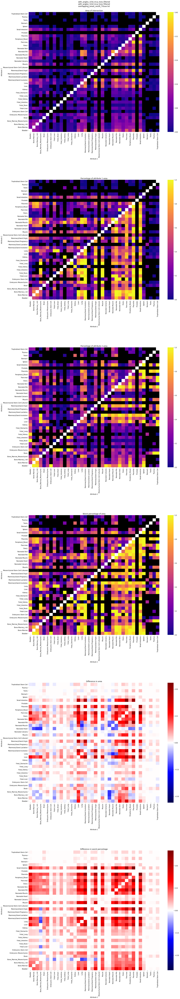

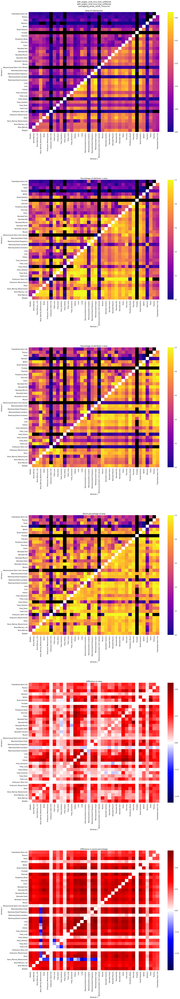

In [39]:
create_heatmaps(dir_3d_filtered, dir_2d_filtered, path_celltype)
create_heatmaps(dir_3d_unfiltered, dir_2d_unfiltered, path_celltype)

with_angles_3/3d_mca_tsne_filtered/overlapping_areas_result_seurat_clusters.txt
and
with_angles_3/2d_mca_tsne_filtered/overlapping_areas_result_seurat_clusters.txt


mean of non-zero values in difference in area 0.014548137528259862
median of non-zero values in difference in area 0.001711479


mean of non-zero values in difference in worst percentage 0.016652898060843902
median of non-zero values in difference in worst percentage 0.001648127


with_angles_3/3d_mca_tsne_unfiltered/overlapping_areas_result_seurat_clusters.txt
and
with_angles_3/2d_mca_tsne_unfiltered/overlapping_areas_result_seurat_clusters.txt


mean of non-zero values in difference in area 0.09163553177896398
median of non-zero values in difference in area 0.07924144999999999


mean of non-zero values in difference in worst percentage 0.06405049721862224
median of non-zero values in difference in worst percentage 0.04146066




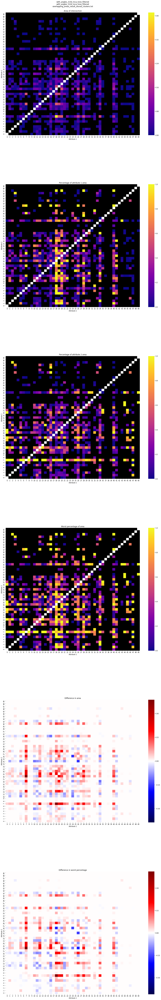

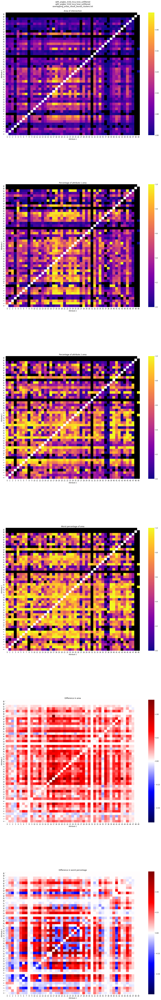

In [40]:
create_heatmaps(dir_3d_filtered, dir_2d_filtered, path_cluster)
create_heatmaps(dir_3d_unfiltered, dir_2d_unfiltered, path_cluster)

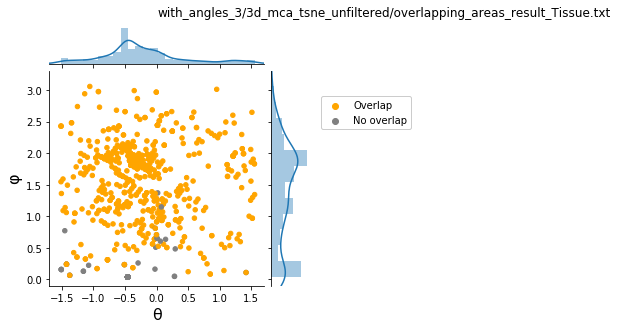

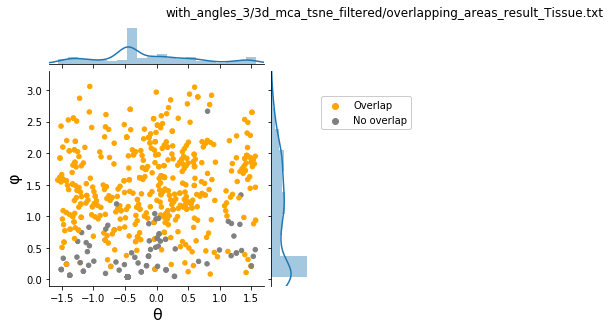

In [41]:
plot_angles(dir_3d_unfiltered + "/" + path_celltype)
plot_angles(dir_3d_filtered + "/" + path_celltype)

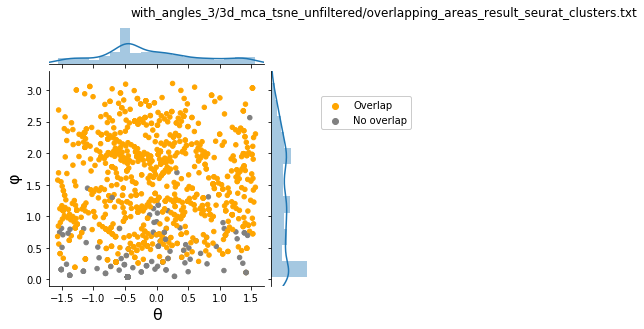

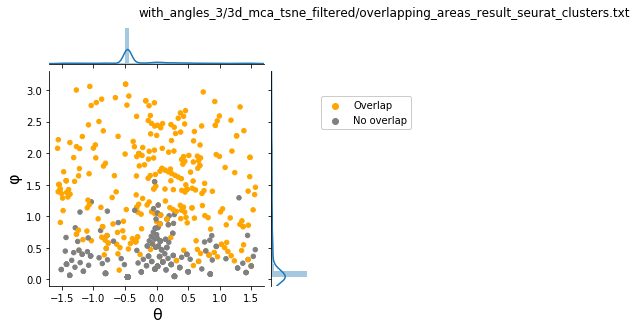

In [42]:
plot_angles(dir_3d_unfiltered + "/" + path_cluster)
plot_angles(dir_3d_filtered + "/" + path_cluster)

# Results

## All boxplots

Text(0.5, 0.98, 'Convex Hull Area Method')

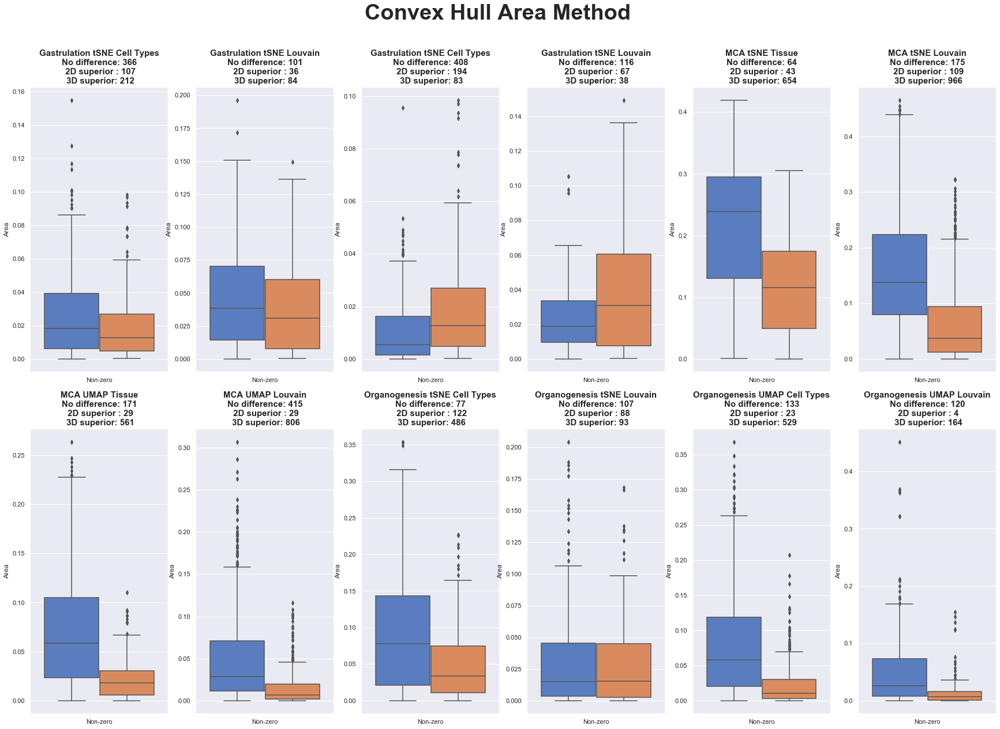

In [40]:
def create_boxplot_subplot(path_3d, path_2d, subplot, cell_count_included=False):
    celltype_3d_area_df, celltype_3d_max_area, celltype_3d_per1_df, celltype_3d_per2_df, _ = read_results(path_3d, cell_count_included=cell_count_included)
    celltype_2d_area_df, celltype_2d_max_area, celltype_2d_per1_df, celltype_2d_per2_df, _ = read_results(path_2d, cell_count_included=cell_count_included)
    
    dataset_title = path_3d.split("/")[1].split("_")
    dataset_title = file_name_decoder[dataset_title[1]] + " " + file_name_decoder[dataset_title[2]]
    dataset_title += " " + file_name_decoder[path_3d.split("_")[-1][0:-4]]
    
    create_dual_boxplot(celltype_3d_area_df, celltype_2d_area_df, subplot, dataset_title)
    
fig = plt.figure(figsize=(30,20))

dir_2d_unfiltered = master_dir+"2d_gas_tsne_unfiltered"
dir_3d_unfiltered = master_dir+"3d_gas_tsne_unfiltered"
path_celltype = "overlapping_areas_result_celltype.txt"
path_cluster = "overlapping_areas_result_louvain.txt"

ax = fig.add_subplot(2,6,1)
create_boxplot_subplot(dir_3d_unfiltered+"/"+path_celltype, dir_2d_unfiltered+"/"+path_celltype, ax, cell_count_included=True)
ax = fig.add_subplot(2,6,2)
create_boxplot_subplot(dir_3d_unfiltered+"/"+path_cluster, dir_2d_unfiltered+"/"+path_cluster, ax, cell_count_included=True)

dir_2d_unfiltered = master_dir+"2d_gas_umap_unfiltered"
dir_3d_unfiltered = master_dir+"3d_gas_tsne_unfiltered"
path_celltype = "overlapping_areas_result_celltype.txt"
path_cluster = "overlapping_areas_result_louvain.txt"

ax = fig.add_subplot(2,6,3)
create_boxplot_subplot(dir_3d_unfiltered+"/"+path_celltype, dir_2d_unfiltered+"/"+path_celltype, ax, cell_count_included=True)
ax = fig.add_subplot(2,6,4)
create_boxplot_subplot(dir_3d_unfiltered+"/"+path_cluster, dir_2d_unfiltered+"/"+path_cluster, ax, cell_count_included=True)

dir_2d_unfiltered = master_dir+"2d_mca_tsne_unfiltered"
dir_3d_unfiltered = master_dir+"3d_mca_tsne_unfiltered"
path_celltype = "overlapping_areas_result_Tissue.txt"
path_cluster = "overlapping_areas_result_seurat_clusters.txt"

ax = fig.add_subplot(2,6,5)
create_boxplot_subplot(dir_3d_unfiltered+"/"+path_celltype, dir_2d_unfiltered+"/"+path_celltype, ax)
ax = fig.add_subplot(2,6,6)
create_boxplot_subplot(dir_3d_unfiltered+"/"+path_cluster, dir_2d_unfiltered+"/"+path_cluster, ax)

dir_2d_unfiltered = master_dir+"2d_mca_umap_unfiltered"
dir_3d_unfiltered = master_dir+"3d_mca_umap_unfiltered"
path_celltype = "overlapping_areas_result_Tissue.txt"
path_cluster = "overlapping_areas_result_seurat_clusters.txt"

ax = fig.add_subplot(2,6,7)
create_boxplot_subplot(dir_3d_unfiltered+"/"+path_celltype, dir_2d_unfiltered+"/"+path_celltype, ax)
ax = fig.add_subplot(2,6,8)
create_boxplot_subplot(dir_3d_unfiltered+"/"+path_cluster, dir_2d_unfiltered+"/"+path_cluster, ax)

dir_2d_unfiltered = master_dir+"2d_org_tsne_unfiltered"
dir_3d_unfiltered = master_dir+"3d_org_tsne_unfiltered"
path_celltype = "overlapping_areas_result_Main.cell.type.txt"
path_cluster = "overlapping_areas_result_seurat_clusters.txt"

ax = fig.add_subplot(2,6,9)
create_boxplot_subplot(dir_3d_unfiltered+"/"+path_celltype, dir_2d_unfiltered+"/"+path_celltype, ax)
ax = fig.add_subplot(2,6,10)
create_boxplot_subplot(dir_3d_unfiltered+"/"+path_cluster, dir_2d_unfiltered+"/"+path_cluster, ax)

dir_2d_unfiltered = master_dir+"2d_org_umap_unfiltered"
dir_3d_unfiltered = master_dir+"3d_org_umap_unfiltered"
path_celltype = "overlapping_areas_result_Main.cell.type.txt"
path_cluster = "overlapping_areas_result_seurat_clusters.txt"

ax = fig.add_subplot(2,6,11)
create_boxplot_subplot(dir_3d_unfiltered+"/"+path_celltype, dir_2d_unfiltered+"/"+path_celltype, ax)
ax = fig.add_subplot(2,6,12)
create_boxplot_subplot(dir_3d_unfiltered+"/"+path_cluster, dir_2d_unfiltered+"/"+path_cluster, ax)


fig.suptitle("Convex Hull Area Method", fontsize=38, fontweight="bold")

## Combined heatmaps

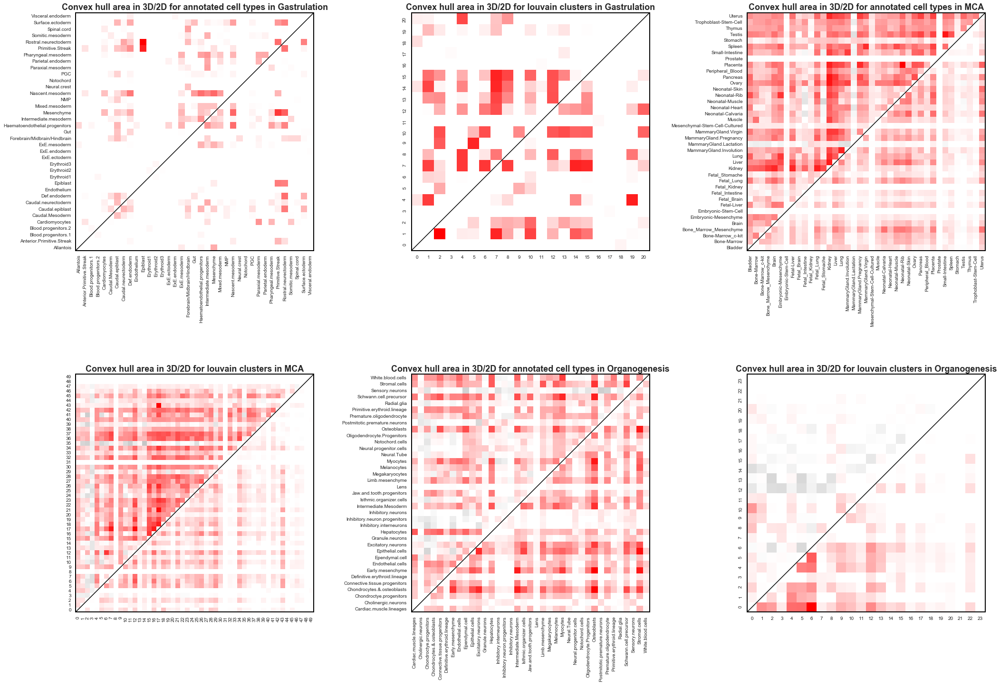

In [42]:
def create_dual_combined_heatmap(dir_3d_unfiltered_tsne, dir_2d_unfiltered_tsne, dir_3d_unfiltered_umap, dir_2d_unfiltered_umap, path_celltype, path_cluster, ax1, ax2, cell_count_included=False):
    cmap = LinearSegmentedColormap.from_list('custom blue', 
                                                 [(0,    '#000000'),
                                                  (0.499, '#ffffff'),
                                                  (0.5, '#ffffff'),
                                                  (0.501, '#ffffff'),
                                                  (1,    '#ff0000')], N=256)
    table_3d_area_tsne, _, _, _, df = read_results(dir_3d_unfiltered_tsne + "/" + path_celltype, cell_count_included = cell_count_included)
    table_2d_area_tsne, _, _, _, _ = read_results(dir_2d_unfiltered_tsne + "/" + path_celltype, cell_count_included = False)
    table_3d_area_umap, _, _, _, _ = read_results(dir_3d_unfiltered_umap + "/" + path_celltype, cell_count_included = cell_count_included)
    table_2d_area_umap, _, _, _, _ = read_results(dir_2d_unfiltered_umap + "/" + path_celltype, cell_count_included = False)

    # make the tables symmetrical
    table_3d_area_tsne += table_3d_area_tsne.T
    table_2d_area_tsne += table_2d_area_tsne.T
    table_3d_area_umap += table_3d_area_umap.T
    table_2d_area_umap += table_2d_area_umap.T
    
    # calculate the difference area, placing the tsne in the lower triangle and the umap in the upper
    table_difference_area = (np.tril(table_2d_area_tsne) + np.triu(table_2d_area_umap)) - (np.tril(table_3d_area_tsne) + np.triu(table_3d_area_umap))
    
    max_value = table_difference_area.max()
    min_value = table_difference_area.min()
    extreme_value = max(abs(max_value), abs(min_value))

    names = sorted(df["attr_1"].append(df["attr_2"]).unique())

    sns.heatmap(table_difference_area, vmin= -extreme_value, vmax= extreme_value, cmap=cmap, xticklabels=names, yticklabels=names, ax=ax1, square=True, cbar=False)
    ax1.invert_yaxis()
    ax1.tick_params(axis='both', which='major', labelsize=10)
    for _, spine in ax1.spines.items():
        spine.set_color("black")
        spine.set_visible(True)
        spine.set_linewidth(2)
    # draw diagonal
    ax1.plot((0,256), (0,256), c="black")
    ax1.set_title("Convex hull area in 3D/2D for annotated cell types in " + file_name_decoder[dir_3d_unfiltered_tsne.split("_")[3]], fontsize=18, fontweight="bold")


    table_3d_area_tsne, _, _, _, df = read_results(dir_3d_unfiltered_tsne + "/" + path_cluster,  cell_count_included = cell_count_included)
    table_2d_area_tsne, _, _, _, _ = read_results(dir_2d_unfiltered_tsne + "/" + path_cluster, cell_count_included = False)
    table_3d_area_umap, _, _, _, _ = read_results(dir_3d_unfiltered_umap + "/" + path_cluster, cell_count_included = cell_count_included)
    table_2d_area_umap, _, _, _, _ = read_results(dir_2d_unfiltered_umap + "/" + path_cluster, cell_count_included = False)
    
    table_3d_area_tsne += table_3d_area_tsne.T
    table_2d_area_tsne += table_2d_area_tsne.T
    table_3d_area_umap += table_3d_area_umap.T
    table_2d_area_umap += table_2d_area_umap.T

    table_difference_area = (np.tril(table_2d_area_tsne) + np.triu(table_2d_area_umap)) - (np.tril(table_3d_area_tsne) + np.triu(table_3d_area_umap))
    max_value = table_difference_area.max()
    min_value = table_difference_area.min()
    extreme_value = max(abs(max_value), abs(min_value))

    names = sorted(df["attr_1"].append(df["attr_2"]).unique())
    ax2.invert_yaxis()
    sns.heatmap(table_difference_area, vmin= -extreme_value, vmax= extreme_value, cmap=cmap, xticklabels=names, yticklabels=names, ax=ax2, square=True, cbar=False)
    ax2.invert_yaxis()
    ax2.tick_params(axis='both', which='major', labelsize=10)
    for _, spine in ax2.spines.items():
        spine.set_color("black")
        spine.set_visible(True)
        spine.set_linewidth(2)
    # draw diagonal
    ax2.plot((0,256), (0,256), c="black")
    ax2.set_title("Convex hull area in 3D/2D for louvain clusters in " + file_name_decoder[dir_3d_unfiltered_tsne.split("_")[3]], fontsize=18, fontweight="bold")

    
fig = plt.figure(figsize= (30,30))

ax1 = fig.add_subplot(331, facecolor=(1,1,1), frameon=True)
ax2 = fig.add_subplot(332, facecolor=(1,1,1), frameon=True)

dir_2d_unfiltered_tsne = master_dir+"2d_gas_tsne_unfiltered"
dir_3d_unfiltered_tsne = master_dir+"3d_gas_tsne_unfiltered"
dir_2d_unfiltered_umap = master_dir+"2d_gas_umap_unfiltered"
dir_3d_unfiltered_umap = master_dir+"3d_gas_umap_unfiltered"
path_celltype = "overlapping_areas_result_celltype.txt"
path_cluster = "overlapping_areas_result_louvain.txt"

create_dual_combined_heatmap(dir_3d_unfiltered_tsne, dir_2d_unfiltered_tsne, dir_3d_unfiltered_umap, dir_2d_unfiltered_umap, path_celltype, path_cluster, ax1=ax1, ax2=ax2, cell_count_included=True)

ax1 = fig.add_subplot(333, facecolor=(1,1,1), frameon=True)
ax2 = fig.add_subplot(334, facecolor=(1,1,1), frameon=True)

dir_2d_unfiltered_tsne = master_dir+"2d_mca_tsne_unfiltered"
dir_3d_unfiltered_tsne = master_dir+"3d_mca_tsne_unfiltered"
dir_2d_unfiltered_umap = master_dir+"2d_mca_umap_unfiltered"
dir_3d_unfiltered_umap = master_dir+"3d_mca_umap_unfiltered"
path_celltype = "overlapping_areas_result_Tissue.txt"
path_cluster = "overlapping_areas_result_seurat_clusters.txt"

create_dual_combined_heatmap(dir_3d_unfiltered_tsne, dir_2d_unfiltered_tsne, dir_3d_unfiltered_umap, dir_2d_unfiltered_umap, path_celltype, path_cluster, ax1=ax1, ax2=ax2)

ax1 = fig.add_subplot(335, facecolor=(1,1,1), frameon=True)
ax2 = fig.add_subplot(336, facecolor=(1,1,1), frameon=True)

dir_2d_unfiltered_tsne = master_dir+"2d_org_tsne_unfiltered"
dir_3d_unfiltered_tsne = master_dir+"3d_org_tsne_unfiltered"
dir_2d_unfiltered_umap = master_dir+"2d_org_umap_unfiltered"
dir_3d_unfiltered_umap = master_dir+"3d_org_umap_unfiltered"
path_celltype = "overlapping_areas_result_Main.cell.type.txt"
path_cluster = "overlapping_areas_result_seurat_clusters.txt"

create_dual_combined_heatmap(dir_3d_unfiltered_tsne, dir_2d_unfiltered_tsne, dir_3d_unfiltered_umap, dir_2d_unfiltered_umap, path_celltype, path_cluster, ax1=ax1, ax2=ax2)

fig.tight_layout(pad=3.0)

In [28]:
#dir_2d_unfiltered_tsne = master_dir+"2d_gas_tsne_unfiltered"
#dir_3d_unfiltered_tsne = master_dir+"3d_gas_tsne_unfiltered"
#dir_2d_unfiltered_umap = master_dir+"2d_gas_umap_unfiltered"
#dir_3d_unfiltered_umap = master_dir+"3d_gas_umap_unfiltered"
#path_celltype = "overlapping_areas_result_celltype.txt"
#path_cluster = "overlapping_areas_result_cluster.txt"
#
#table_3d_area_tsne, _, _, _, df = read_results(dir_3d_unfiltered_tsne + "/" + path_cluster)
#table_2d_area_tsne, _, _, _, _ = read_results(dir_2d_unfiltered_tsne + "/" + path_cluster)
#
#sorted(df["attr_1"].append(df["attr_2"]).unique())
#np.shape(table_3d_area_tsne)

(18, 18)

In [18]:
def replace_spaces_in_attr_names():
    in_file = open(master_dir +  "/2d_gas_tsne_unfiltered/overlapping_areas_result_celltype.txt", "r")
    out_file = open(master_dir + "/2d_gas_tsne_unfiltered/overlapping_areas_result_celltype_new.txt", "w")
    replace = {"Primitive Streak" : "Primitive.Streak",
               "ExE ectoderm" : "ExE.ectoderm",
               "Visceral endoderm" : "Visceral.endoderm",
               "ExE endoderm" : "ExE.endoderm",
               "Nascent mesoderm" : "Nascent.mesoderm",
               "Rostral neurectoderm" : "Rostral.neurectoderm",
               "Blood progenitors" : "Blood.progenitors",
               "Mixed mesoderm" : "Mixed.mesoderm",
               "ExE mesoderm" : "ExE.mesoderm",
               "Intermediate mesoderm" : "Intermediate.mesoderm",
               "Pharyngeal mesoderm" : "Pharyngeal.mesoderm",
               "Caudal epiblast" : "Caudal.epiblast",
               "Haematoendothelial progenitors" : "Haematoendothelial.progenitors",
               "Blood progenitors" : "Blood.progenitors",
               "Surface ectoderm" : "Surface.ectoderm",
               "Paraxial mesoderm" : "Paraxial.mesoderm",
               "Caudal neurectoderm" : "Caudal.neurectoderm",
               "Somitic mesoderm" : "Somitic.mesoderm",
               "Caudal Mesoderm" : "Caudal.Mesoderm",
               "Def. endoderm" : "Def.endoderm",
               "Parietal endoderm" : "Parietal.endoderm",
               "Anterior Primitive Streak" : "Anterior.Primitive.Streak",
               "Spinal cord" : "Spinal.cord",
               "Neural crest" : "Neural.crest",
               "Anterior Primitive.Streak" : "Anterior.Primitive.Streak"
              }
    for line in in_file:
        for key in replace:
            line = line.replace(key, replace[key])
        out_file.write(line)

    in_file.close()
    out_file.close()
    
replace_spaces_in_attr_names()